In [1]:
import numpy as np
from numpy import *
from pylab import *
from math import *
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import os 
import pandas as pd
import glob
from astropy.io import ascii
import itertools
from datetime import datetime

# Ajuste gaussiano
from scipy.optimize import minimize
import emcee
import corner
from IPython.display import display, Math
from scipy.optimize import curve_fit

path = os.getcwd()

### Sustracción del espectro de los gases

Una vez se obtiene el espectro sintetizado mediante Starlight se procede a obtener el espectro del gas.

El espectro sintetizado por el código de Starlight se corresponde con la parte estelar, por lo que al eliminarla obtenemos los gases.

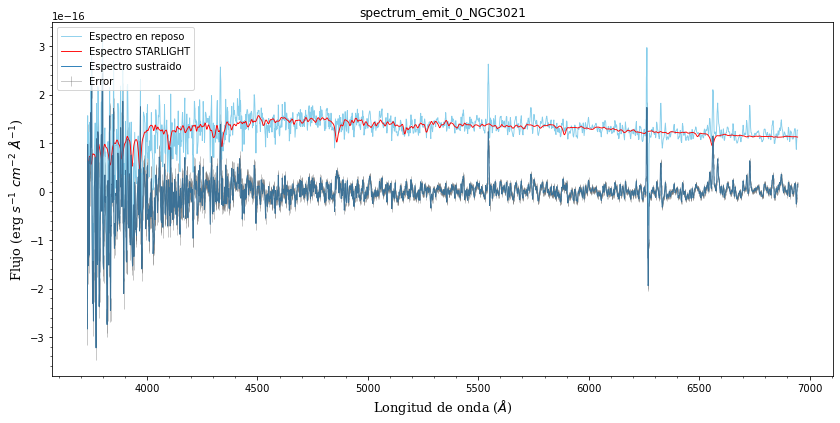

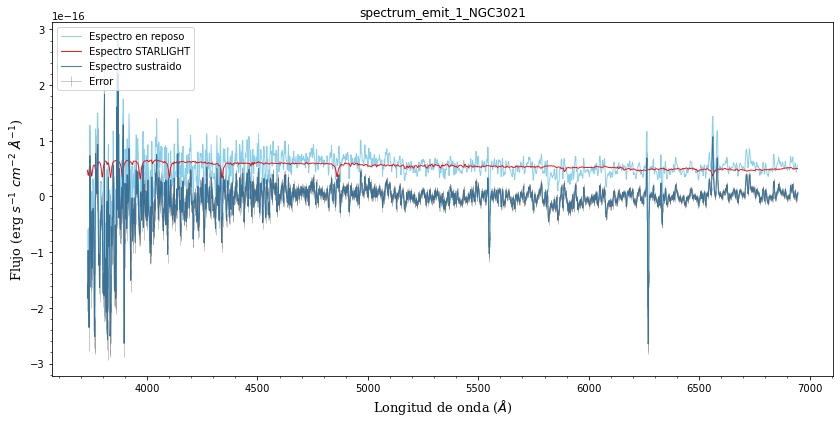

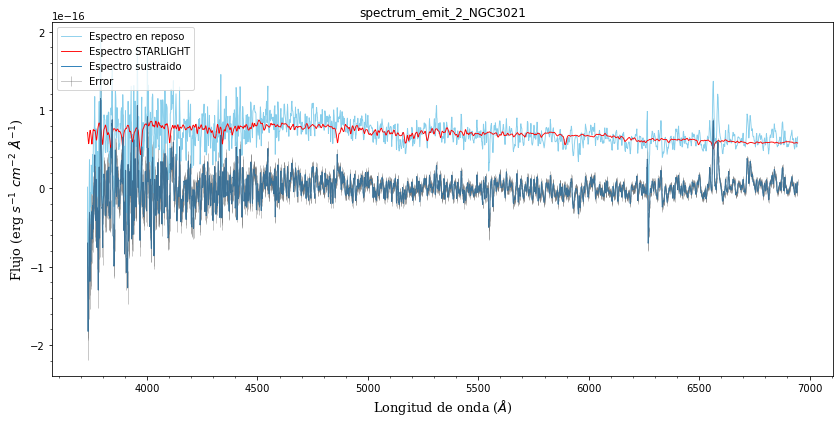

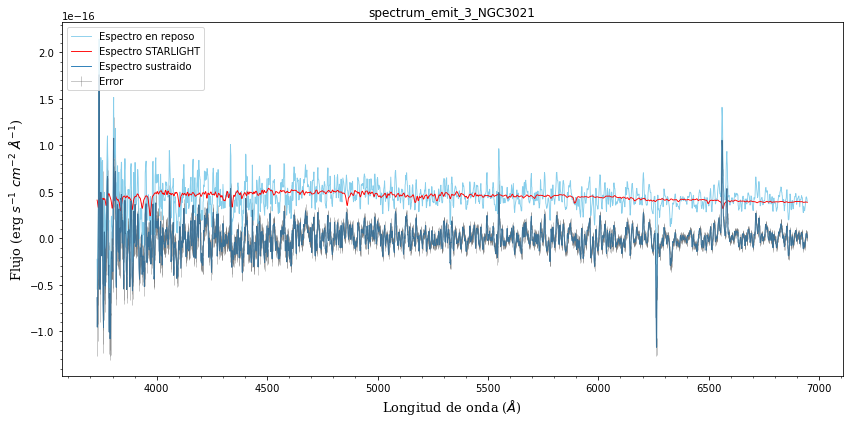

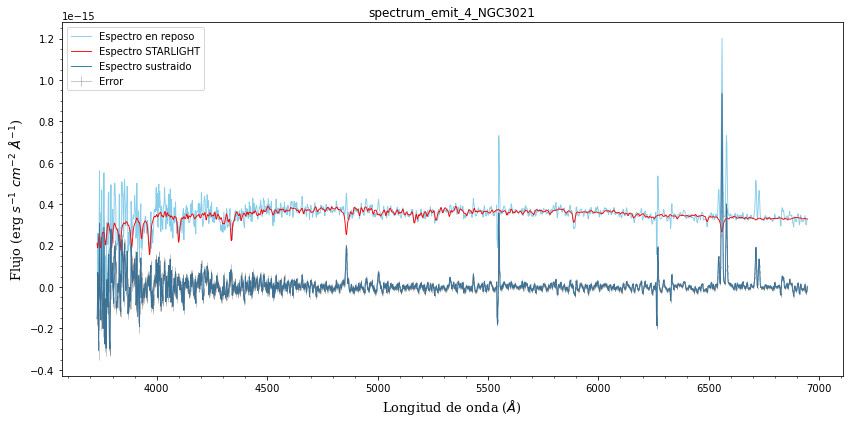

...

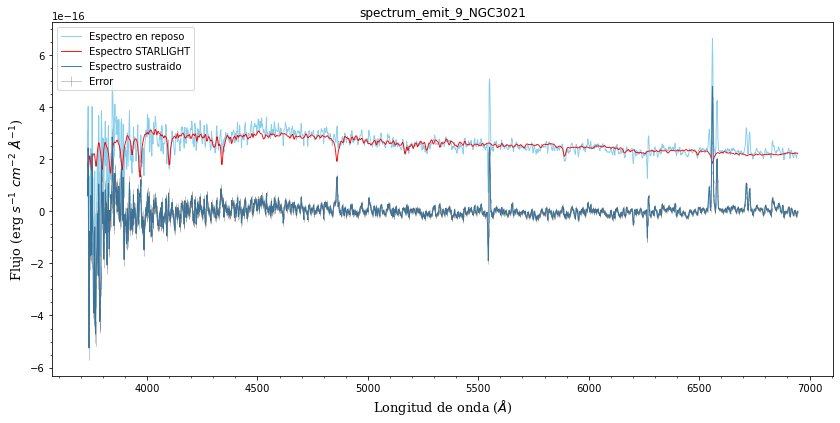

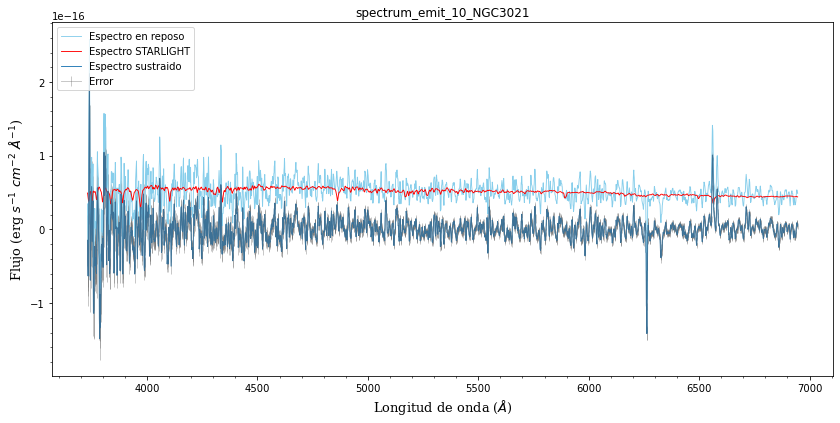

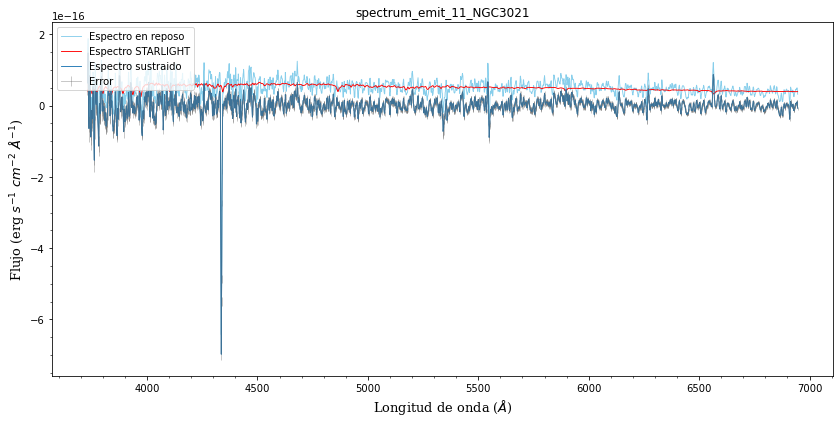

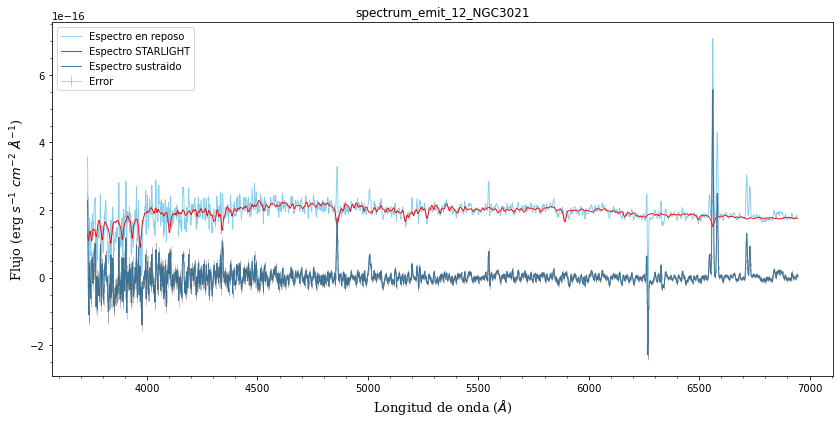

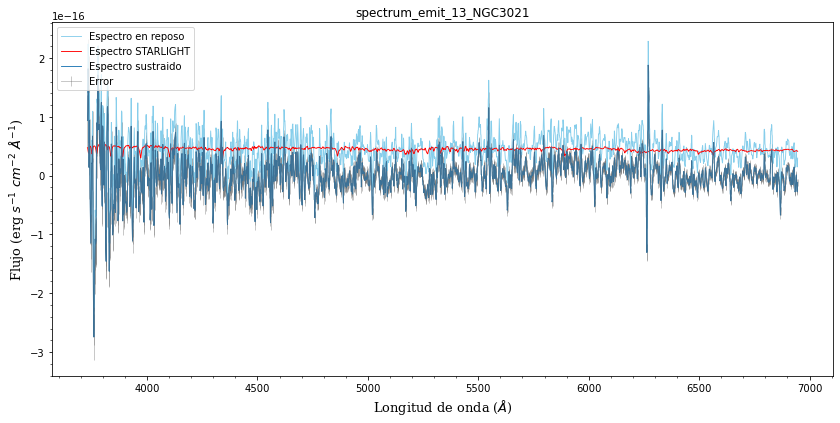

In [4]:
os.chdir(path+'\emited_spectrum')    
os.getcwd()

l_obs_todos = []
f_obs_todos = []
f_syn_todos = []
e_emit_todos = []

lenn = len(glob.glob1(path+'\emited_spectrum',"*.BN"))
#for i in list(itertools.chain(range(lenn-10,lenn-9))):
for i in range(len(glob.glob1(path+'/emited_spectrum',"*.BN"))):
    file = 'spectrum_emit_'+str(i)+'_NGC3021'
    l_obs = []
    f_obs = []
    f_syn = []
    with open(file+'.BN', 'r') as SL:
        f_obs_norm = float((np.array((SL.readlines()[25]).split()))[0,])
    with open(file+'.BN', 'r') as SL:
        data = SL.readlines()[1078:4334]   
        for linea in data:
            linea = np.array(linea.split())
            if float(linea[1]) != 0:
                l_obs.append(float(linea[0,]))
                f_obs.append(float(linea[1,]))
                f_syn.append(float(linea[2,]))
        l_obs = np.array(l_obs)
        f_obs = np.array(f_obs)*f_obs_norm
        f_syn = np.array(f_syn)*f_obs_norm
    
    e_emit = []
    with open(file+'.txt','r') as datos:
        data = datos.readlines()
        for linea in data:
            linea = np.array(linea.split())
            if float(linea[0]) >= l_obs[0] and float(linea[0]) <= l_obs[-1]:
                e_emit.append(float(linea[2,]))
        e_emit = np.array(e_emit)        
        
    
    fig, ax = plt.subplots(figsize=(14,6.5))
    ax.plot(l_obs,f_obs,color='skyblue', linewidth=0.9,label="Espectro en reposo")
    ax.plot(l_obs,f_syn,color='red', linewidth=0.9,label="Espectro STARLIGHT")
    ax.errorbar(l_obs,f_obs-f_syn,yerr=e_emit,linewidth=0.9, alpha=0.4, label='Error', color='dimgrey')
    ax.plot(l_obs,f_obs-f_syn, linewidth=0.9,label="Espectro sustraido")
    
    xlabel(r'Longitud de onda ($\AA$)', fontsize=13,fontfamily='serif'); ylabel(r'Flujo (erg $s^{-1}$ $cm^{-2}$ $\AA^{-1}$)', fontsize=13,fontfamily='serif') 
    plt.legend(loc='upper left')
    title('%s' %(file));plt.legend(loc='upper left')
    plt.minorticks_on()
    #axvline(4861, color='k', ls="dotted",lw='0.9')
    #text(4881, 8.3*10**(-16), r'[H$_{\beta}$] 4861',alpha=0.8,rotation='vertical',fontsize='11') 
    #axvline(5007, color='k', ls="dotted",lw='0.9')
    #text(5027, 8.3*10**(-16), r'[O III] 5007',alpha=0.8,rotation='vertical',fontsize='11') 
    #axvline(6563, color='k', ls="dotted",lw='0.9')
    #text(6485, 9.9*10**(-16), r'[H$_{\alpha}$] 6563',alpha=0.8,rotation='vertical',fontsize='11') 
    #axvline(6583, color='k', ls="dotted",lw='0.9')
    #text(6603, 9.9*10**(-16), r'[N II] 6583',alpha=0.8,rotation='vertical',fontsize='11') 
    #axvline(6716, color='k', ls="dotted",lw='0.9')
    #text(6646, 6.5*10**(-16), r'[S II] 6716',alpha=0.8,rotation='vertical',fontsize='11') 
    #axvline(6731, color='k', ls="dotted",lw='0.9')
    #text(6751, 6.5*10**(-16), r'[S II] 6731',alpha=0.8,rotation='vertical',fontsize='11')  
    #plt.savefig('espectro_final.png')
    plt.show() 
    
    l_obs_todos.append(l_obs)
    f_obs_todos.append(f_obs)
    f_syn_todos.append(f_syn)
    e_emit_todos.append(e_emit)
    
l_obs_todos = np.array(l_obs_todos)
f_obs_todos = np.array(f_obs_todos)
f_syn_todos = np.array(f_syn_todos)
e_emit_todos = np.array(e_emit_todos)

### Ajuste gaussiano en las líneas de Hbeta, OIII, Halfa y NII

Se emplean dos ajustes distintos:
 - Dos ajustes simple para Hb y OIII 
         def gaussian(x, a, x0, sigma):
            return a*np.exp(-(x-x0)**2/(2*sigma**2))
            
 - Un ajuste triple para Halfa y NII 
         def gaussian_2(x, a1 ,a2,a3, x0, sigma):
           return a1*np.exp(-(x-x0)**2/(2*sigma**2))+a2*np.exp(-(x-(x0+d1))**2/(2*sigma**2))+a3*np.exp(-(x-(x0-d2))**2/(2*sigma**2))
        
   
Como las líneas de Halfa y NII están muy cerca hay que hacer un ajuste de tres gaussianas a la vez. 


AJUSTANDO ESPECTRO 0

Ajuste en 4861 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


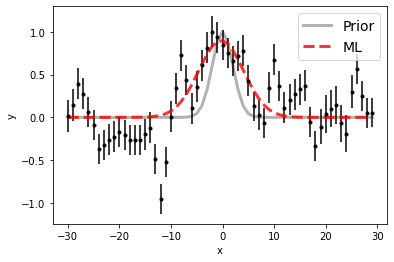

100%|██████████| 15000/15000 [00:14<00:00, 1012.80it/s]


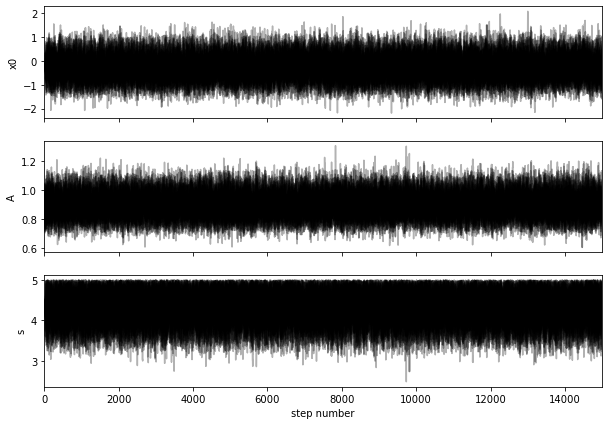

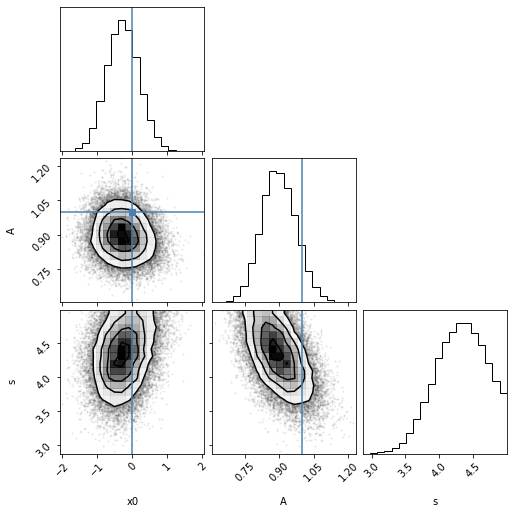

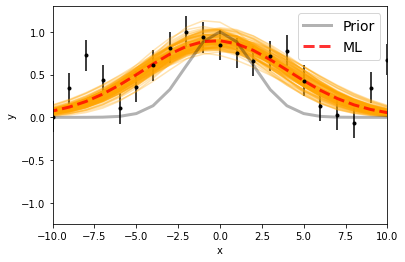

Maximum likelihood estimates:
x0 = -0.283
A = 0.897
s = 4.348


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4860.725498724469 [0.45183206 0.46332459]
A  =  3.873429614944264e-17 [3.10489375e-18 3.38598640e-18]
s  =  4.331824739620697 [0.39486384 0.37763725]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


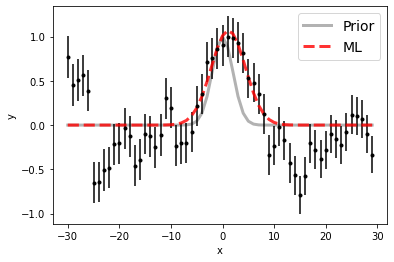

100%|██████████| 15000/15000 [00:14<00:00, 1040.11it/s]


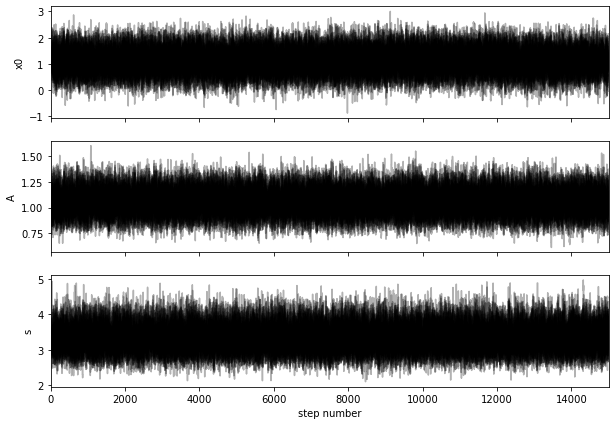

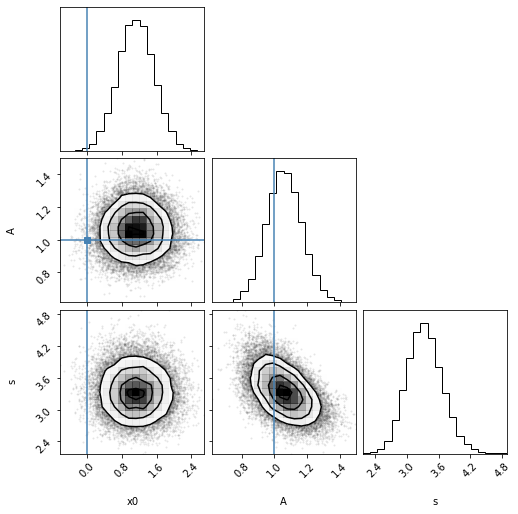

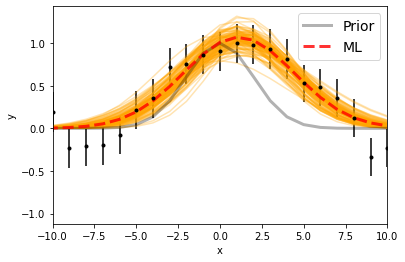

Maximum likelihood estimates:
x0 = 1.127
A = 1.070
s = 3.314


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  5008.12505892647 [0.41042586 0.41554179]
A  =  3.308341818464837e-17 [3.31780479e-18 3.40683492e-18]
s  =  3.323278122147254 [0.31631324 0.34894744]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros prior:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


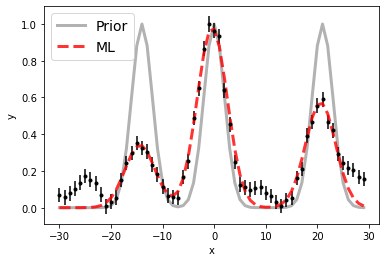

100%|██████████| 15000/15000 [00:21<00:00, 682.38it/s]


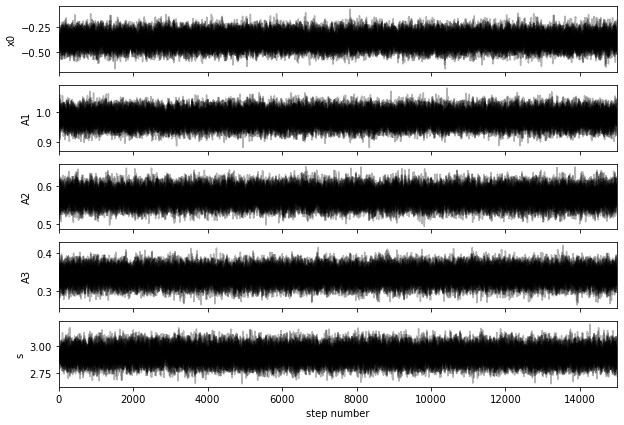

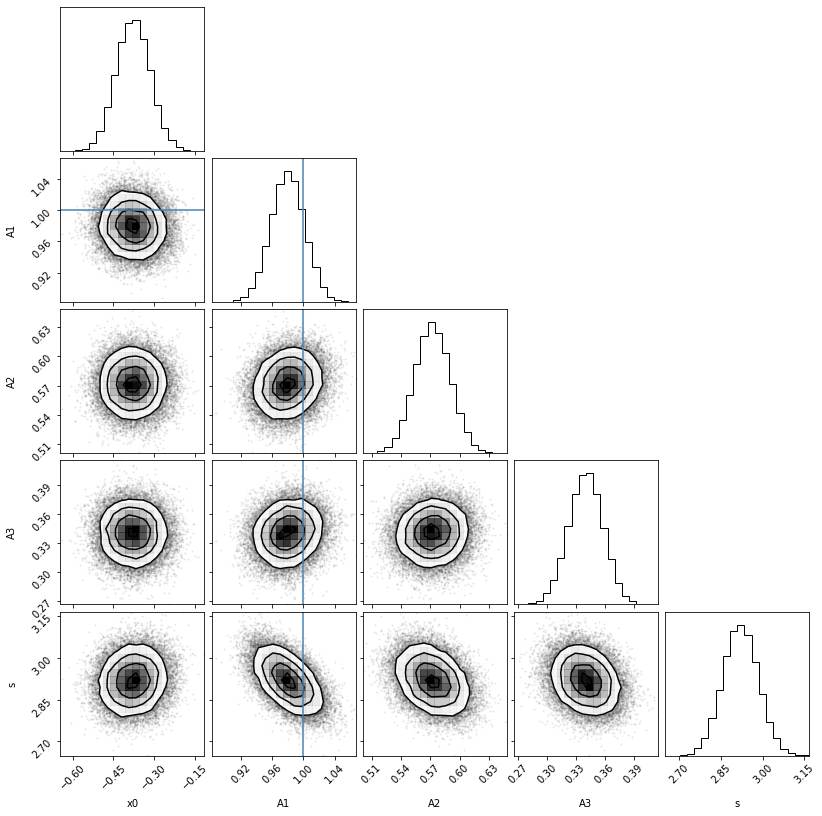

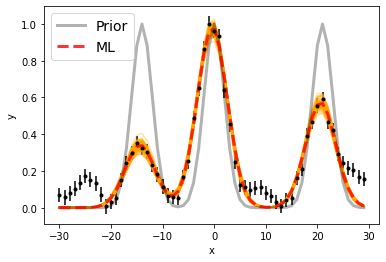

Maximum likelihood estimates:
x0 = -0.379
A1 = 0.980
A2 = 0.572
A3 = 0.340
s = 2.919


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6562.621808854758 6583.621808854758 [0.06203275 0.06201496]
A1, A2   =  1.1199029194014228e-16 6.540246009296582e-17 [2.45484999e-18 2.49429150e-18] [2.07778711e-18 2.09223060e-18]
s  =  2.9193527918245348 [0.06295174 0.06380093]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 1

Ajuste en 4861 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


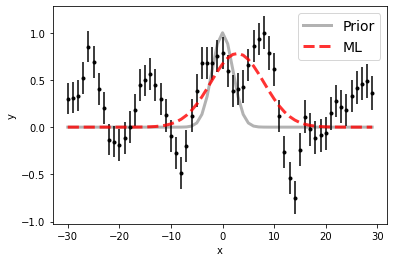

  0%|          | 0/15000 [00:00<?, ?it/s]C:\Users\saruk\anaconda3\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 15000/15000 [00:07<00:00, 2079.20it/s]


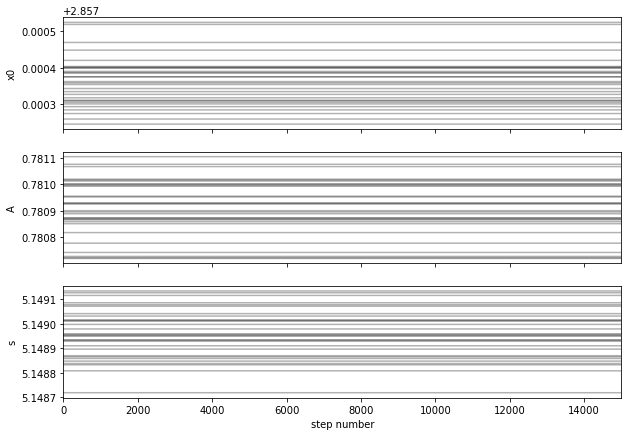

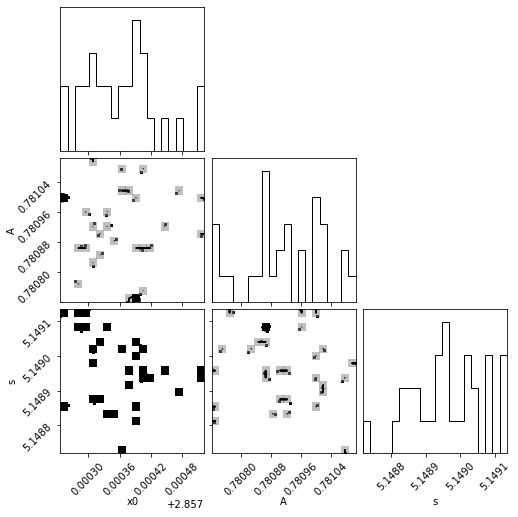

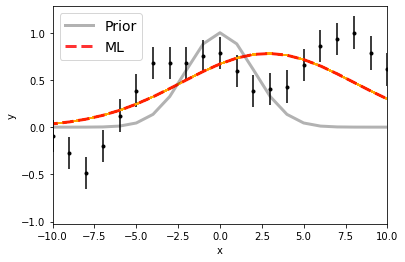

Maximum likelihood estimates:
x0 = 2.857
A = 0.781
s = 5.149


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4863.857360312743 [6.65926128e-05 5.96478124e-05]
A  =  3.0673500028420606e-17 [5.31538482e-21 4.03674362e-21]
s  =  5.148954226787051 [0.00010653 0.00012385]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


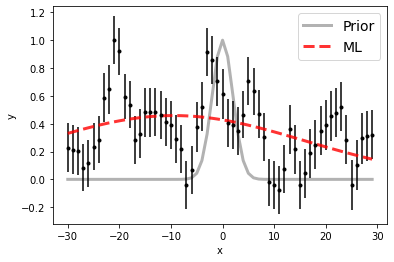

  0%|          | 0/15000 [00:00<?, ?it/s]C:\Users\saruk\anaconda3\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 15000/15000 [00:07<00:00, 2012.52it/s]


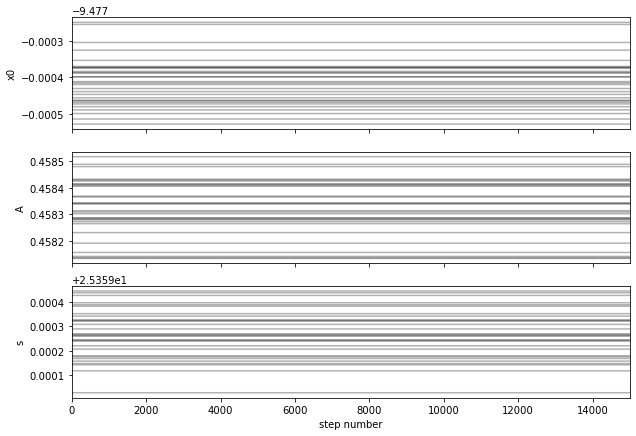

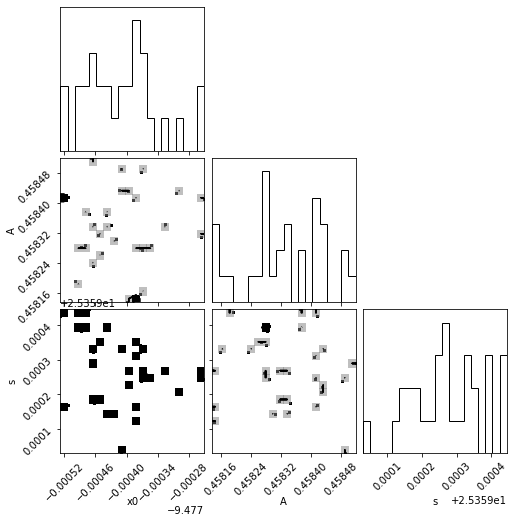

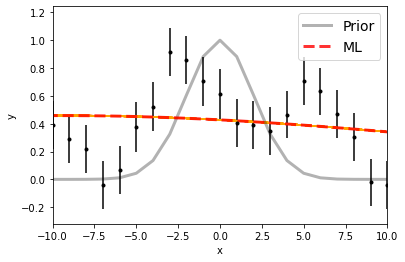

Maximum likelihood estimates:
x0 = -9.477
A = 0.458
s = 25.359


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4997.522586723214 [6.65926128e-05 5.96478124e-05]
A  =  1.631314920297265e-17 [4.81655703e-21 3.65791124e-21]
s  =  25.359264723927318 [0.00010653 0.00012385]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros prior:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


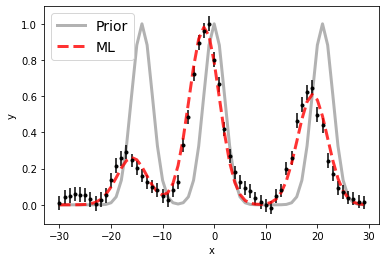

100%|██████████| 15000/15000 [00:22<00:00, 678.24it/s]


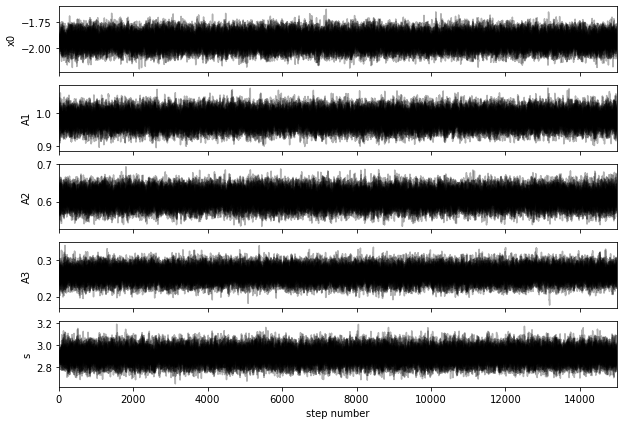

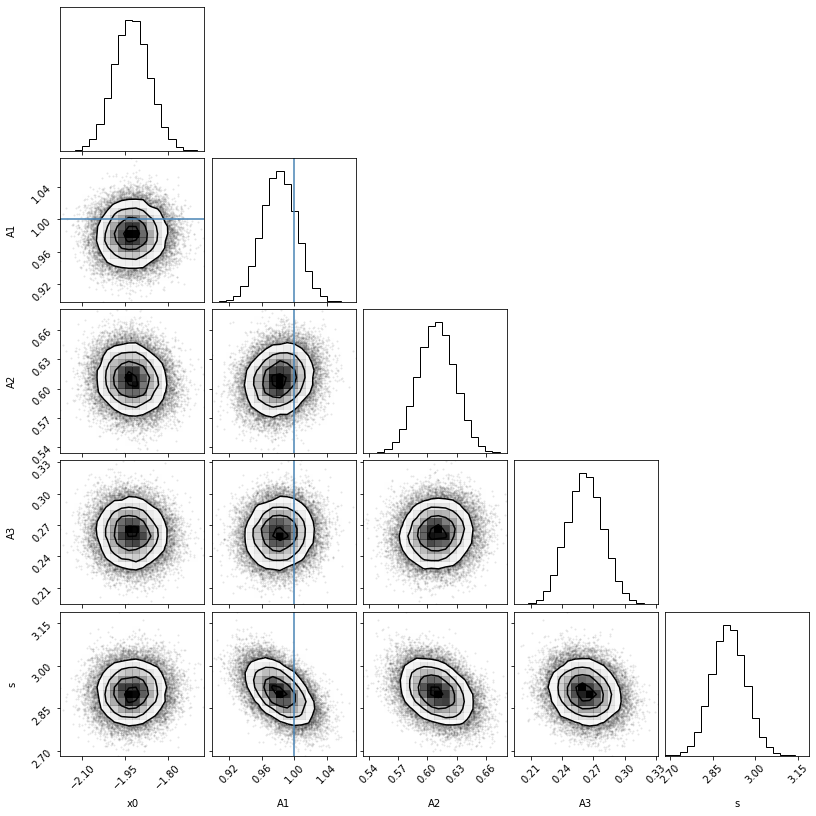

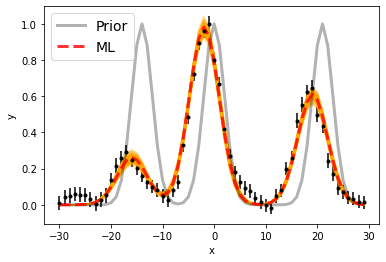

Maximum likelihood estimates:
x0 = -1.926
A1 = 0.982
A2 = 0.609
A3 = 0.262
s = 2.907


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6561.072012536593 6582.072012536593 [0.0607501  0.06183739]
A1, A2   =  1.0514210653521189e-16 6.527093436404482e-17 [2.23628842e-18 2.27888285e-18] [2.02051285e-18 2.03832993e-18]
s  =  2.9060970272903006 [0.0578676  0.05981641]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 2

Ajuste en 4861 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


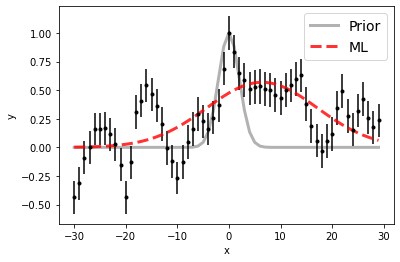

  0%|          | 0/15000 [00:00<?, ?it/s]C:\Users\saruk\anaconda3\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 15000/15000 [00:07<00:00, 2090.87it/s]


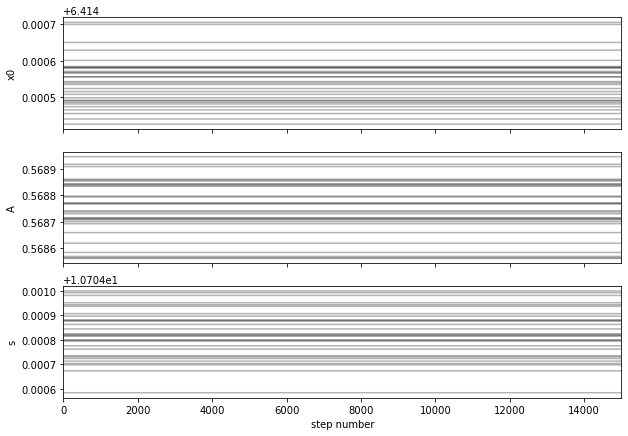

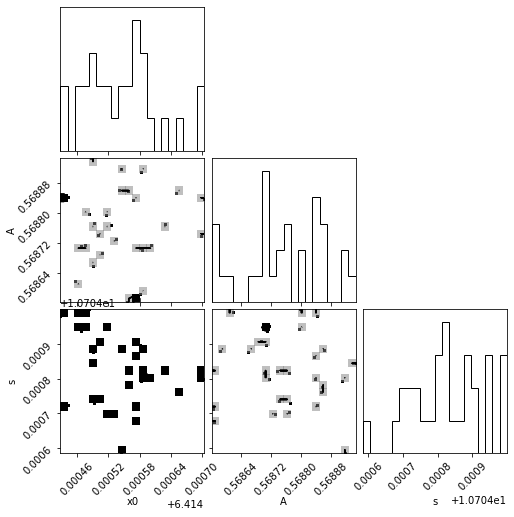

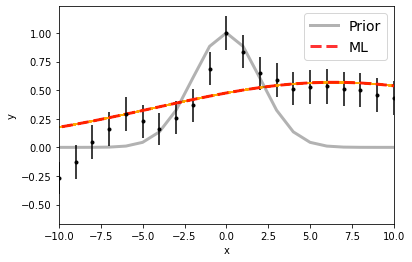

Maximum likelihood estimates:
x0 = 6.415
A = 0.569
s = 10.705


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4867.414541579971 [6.65926128e-05 5.96478124e-05]
A  =  2.4763382178393888e-17 [5.89195402e-21 4.47461635e-21]
s  =  10.704819733026799 [0.00010653 0.00012385]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


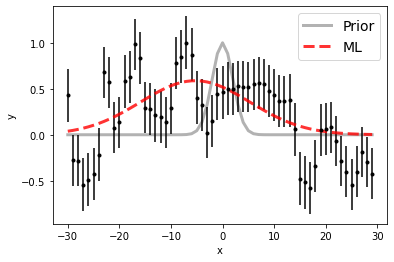

  0%|          | 0/15000 [00:00<?, ?it/s]C:\Users\saruk\anaconda3\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 15000/15000 [00:07<00:00, 2088.21it/s]


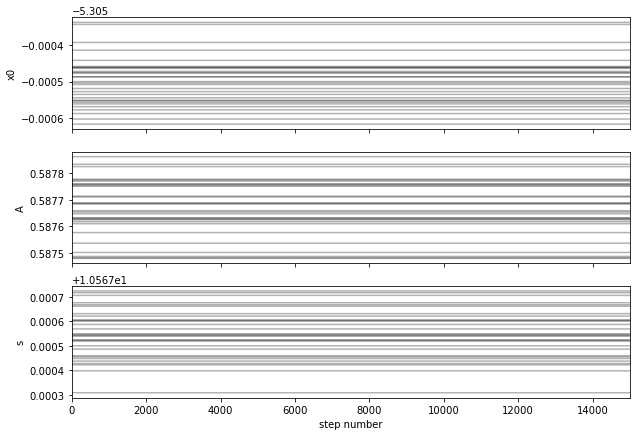

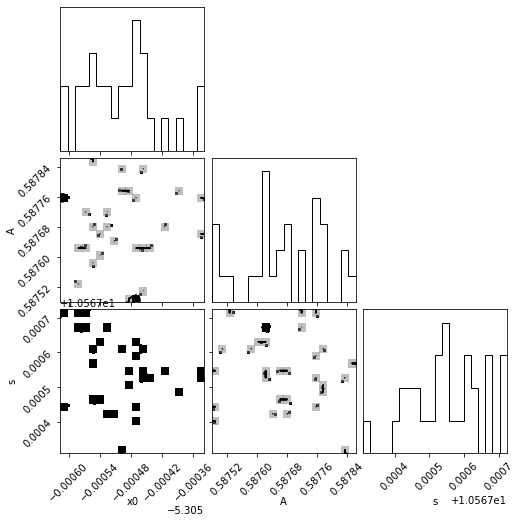

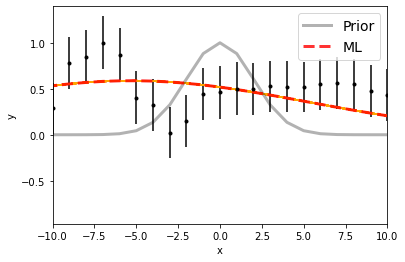

Maximum likelihood estimates:
x0 = -5.305
A = 0.588
s = 10.568


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  5001.694498147059 [6.65926128e-05 5.96478124e-05]
A  =  1.2231089056274096e-17 [2.81647082e-21 2.13895531e-21]
s  =  10.567543597176766 [0.00010653 0.00012385]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros prior:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


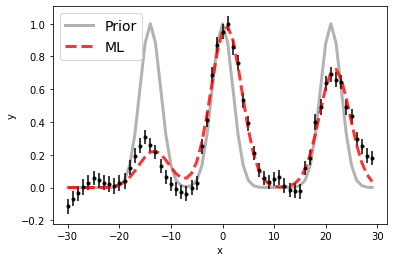

100%|██████████| 15000/15000 [00:21<00:00, 685.51it/s]


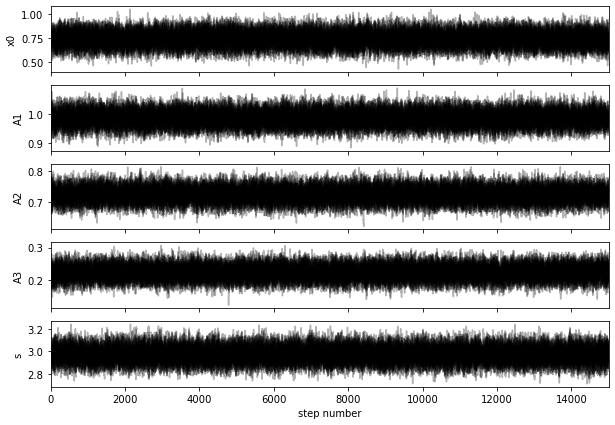

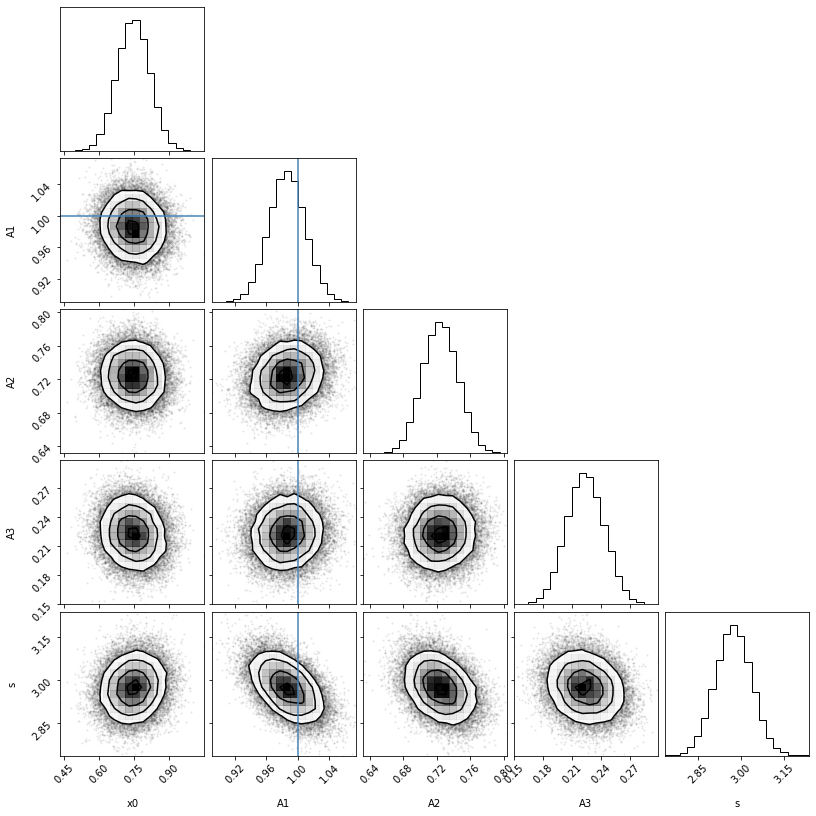

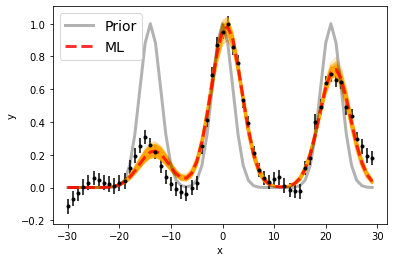

Maximum likelihood estimates:
x0 = 0.744
A1 = 0.987
A2 = 0.724
A3 = 0.223
s = 2.973


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6563.745351815605 6584.745351815605 [0.07010437 0.06933929]
A1, A2   =  8.527179466575267e-17 6.257097006600293e-17 [1.99438339e-18 1.98863826e-18] [1.78766939e-18 1.83331724e-18]
s  =  2.973498716126443 [0.06294492 0.06278764]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 3

Ajuste en 4861 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


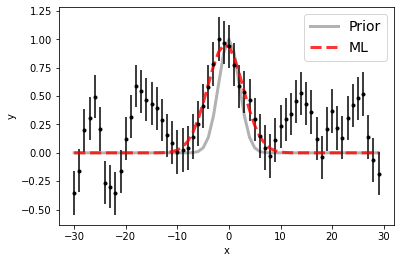

100%|██████████| 15000/15000 [00:14<00:00, 1060.75it/s]


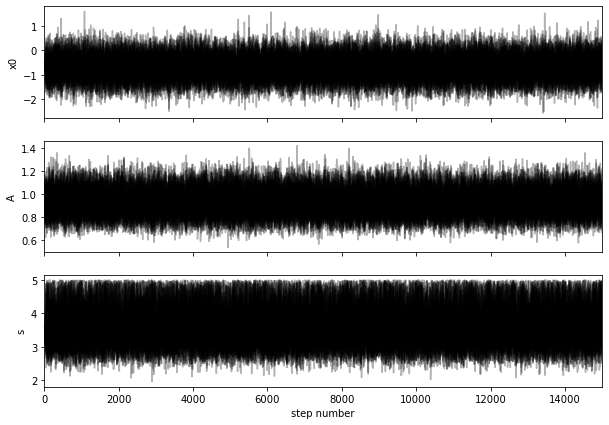

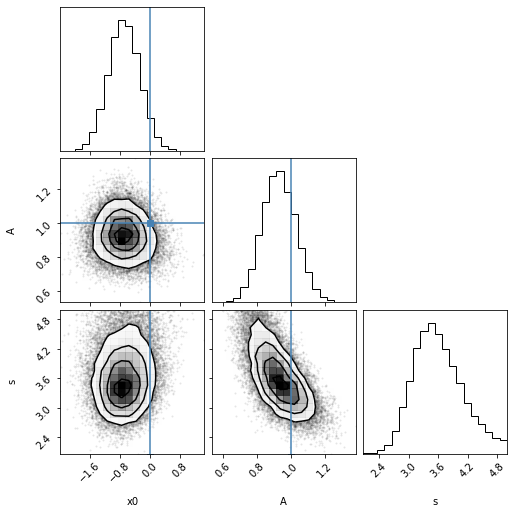

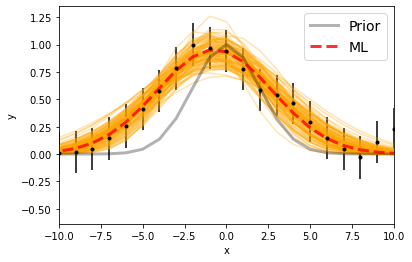

Maximum likelihood estimates:
x0 = -0.703
A = 0.954
s = 3.439


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4860.307667160631 [0.41138949 0.418981  ]
A  =  2.6151609735066553e-17 [2.74134491e-18 2.90165723e-18]
s  =  3.553959208632037 [0.43593565 0.56241452]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


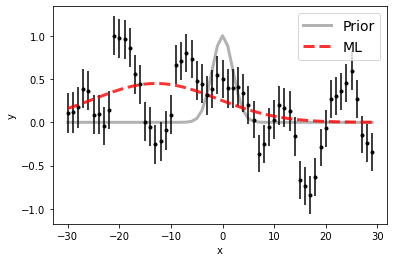

  0%|          | 0/15000 [00:00<?, ?it/s]C:\Users\saruk\anaconda3\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 15000/15000 [00:07<00:00, 2134.26it/s]


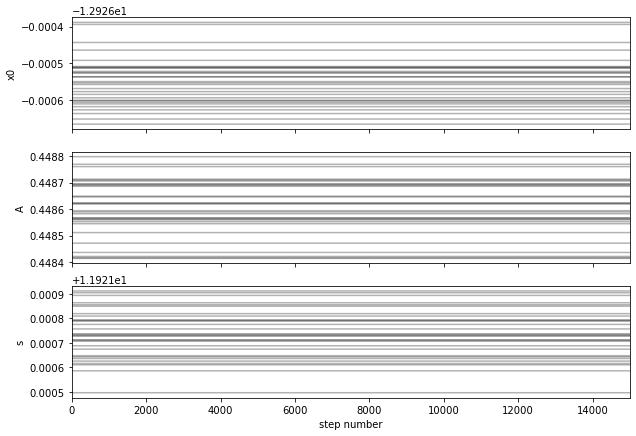

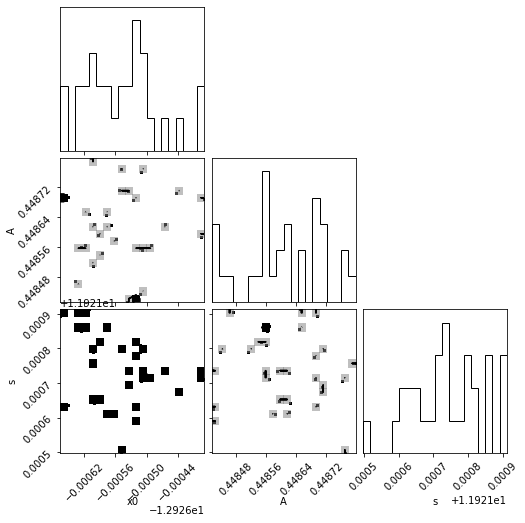

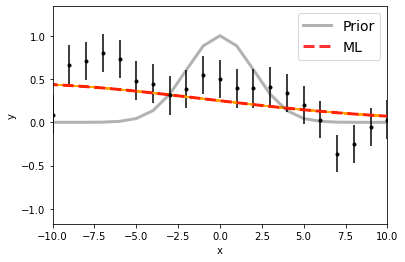

Maximum likelihood estimates:
x0 = -12.927
A = 0.449
s = 11.922


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4994.07344810268 [6.65926128e-05 5.96478124e-05]
A  =  1.0336501508803016e-17 [3.11804334e-21 2.36798313e-21]
s  =  11.92173198876067 [0.00010653 0.00012385]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros prior:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


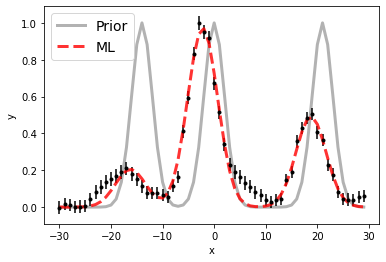

100%|██████████| 15000/15000 [00:23<00:00, 648.71it/s]


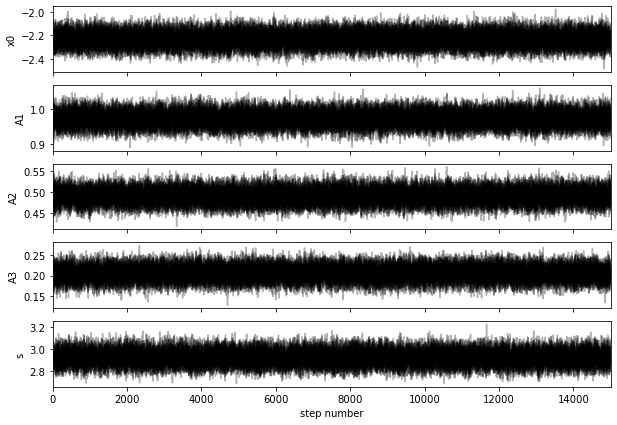

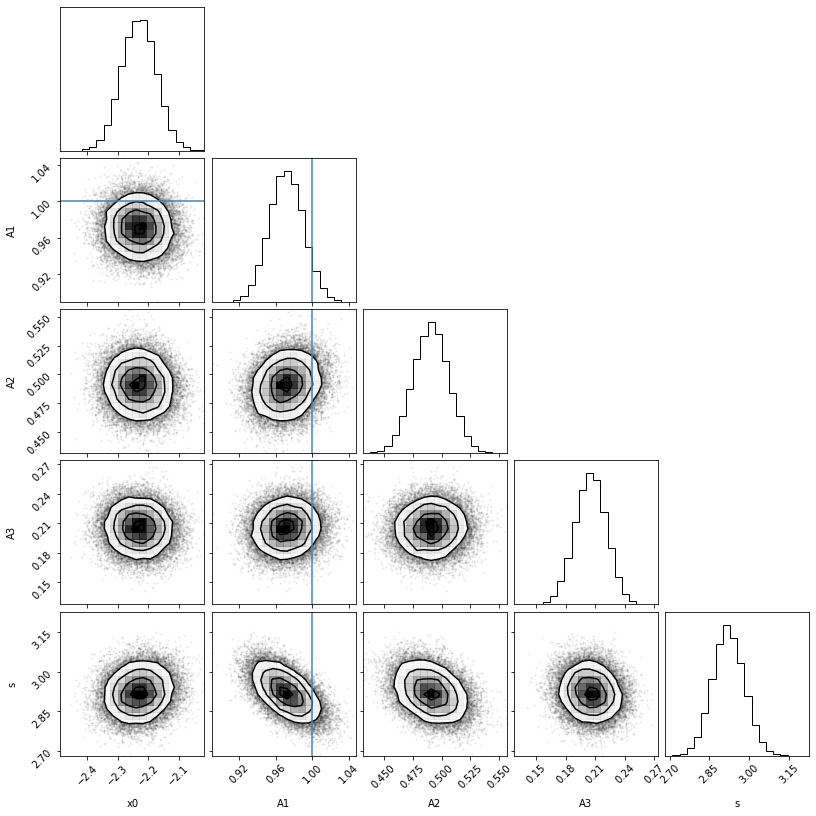

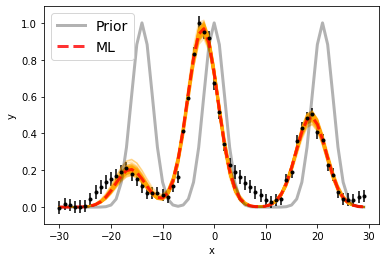

Maximum likelihood estimates:
x0 = -2.230
A1 = 0.972
A2 = 0.491
A3 = 0.205
s = 2.922


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6560.769973692323 6581.769973692323 [0.05739917 0.05638291]
A1, A2   =  1.0249989923498187e-16 5.180914102536981e-17 [1.96464648e-18 1.97556627e-18] [1.64486136e-18 1.61520626e-18]
s  =  2.9211742038770154 [0.05797323 0.05997325]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 4

Ajuste en 4861 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


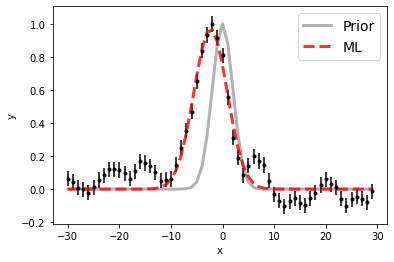

100%|██████████| 15000/15000 [00:14<00:00, 1024.14it/s]


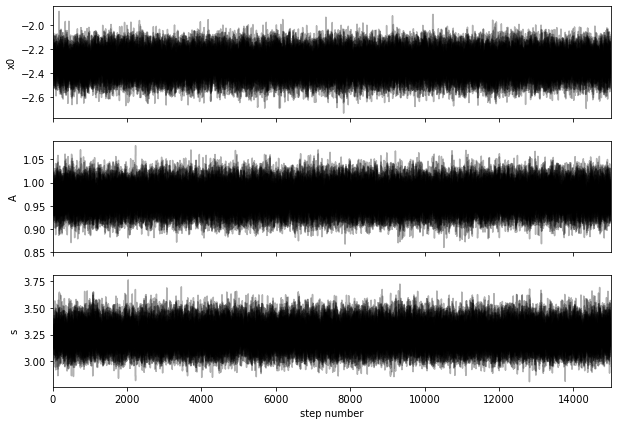

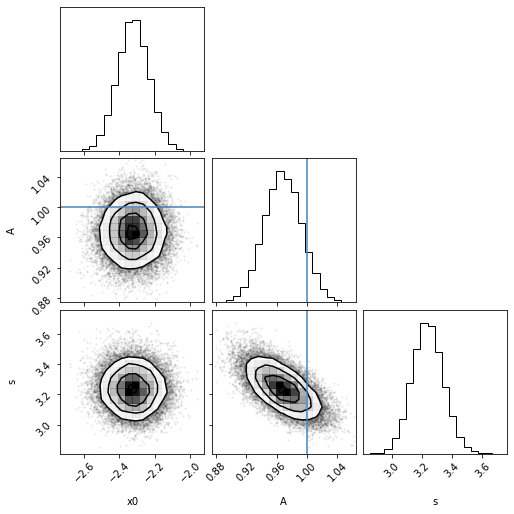

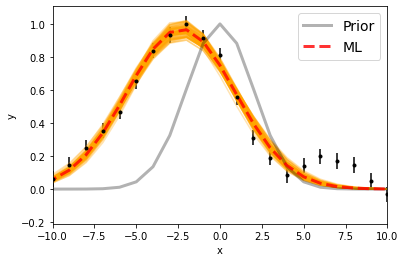

Maximum likelihood estimates:
x0 = -2.323
A = 0.970
s = 3.231


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4858.677393015207 [0.08964538 0.0886997 ]
A  =  1.918452735924438e-16 [4.84624889e-18 4.95897011e-18]
s  =  3.2364008868923957 [0.10139623 0.10437755]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


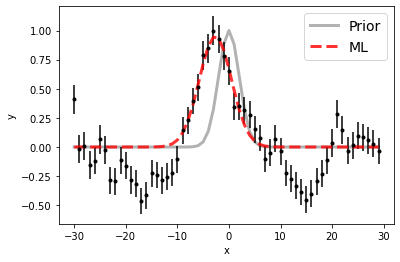

100%|██████████| 15000/15000 [00:14<00:00, 1015.36it/s]


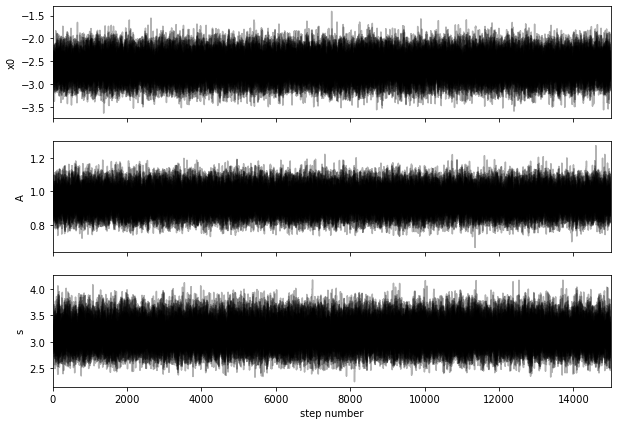

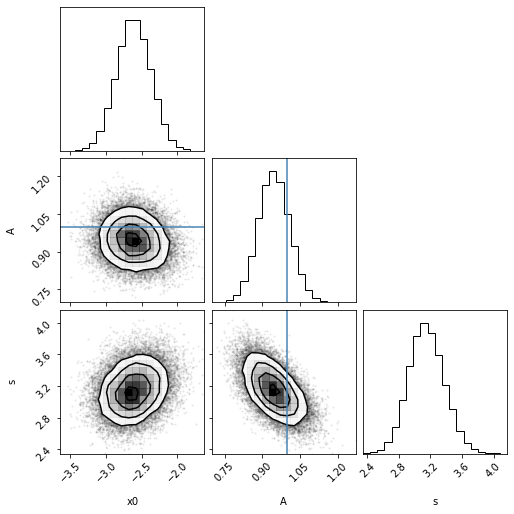

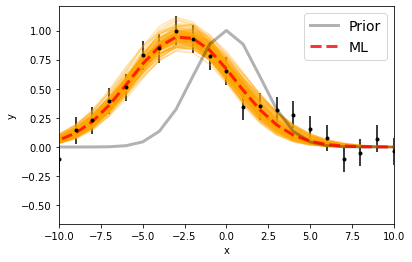

Maximum likelihood estimates:
x0 = -2.622
A = 0.950
s = 3.137


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  5004.38227514689 [0.23843129 0.24296406]
A  =  6.853953500669854e-17 [4.40776783e-18 4.59856468e-18]
s  =  3.1437007392192875 [0.21598166 0.22983646]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros prior:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


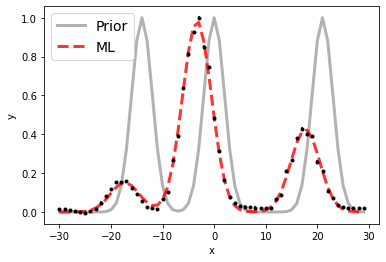

100%|██████████| 15000/15000 [00:23<00:00, 642.66it/s]


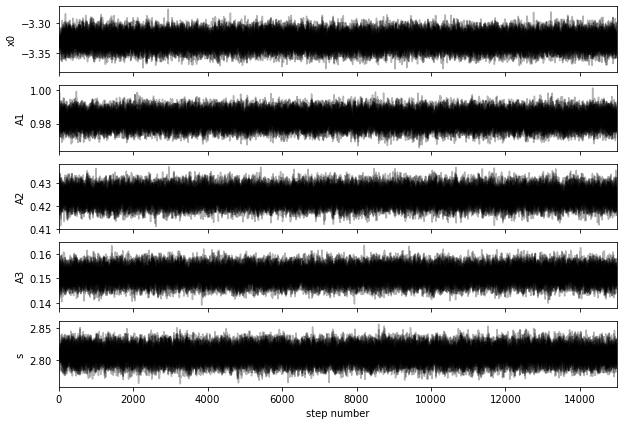

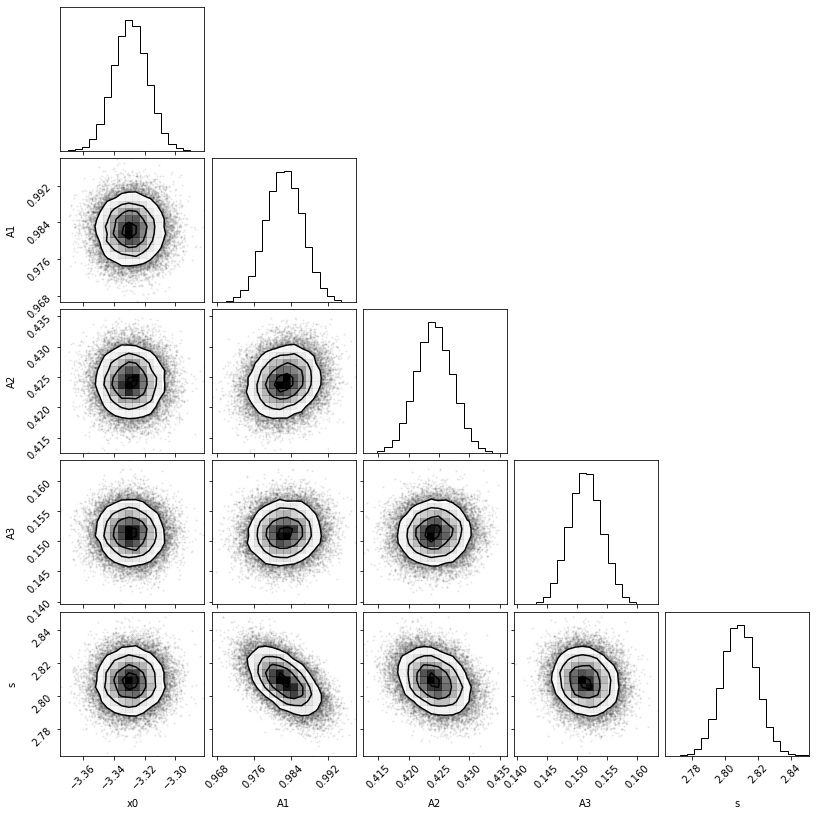

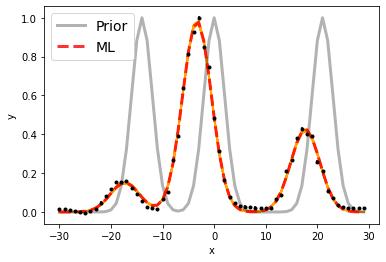

Maximum likelihood estimates:
x0 = -3.329
A1 = 0.983
A2 = 0.424
A3 = 0.151
s = 2.809


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6559.670872258722 6580.670872258722 [0.01100799 0.01093972]
A1, A2   =  9.169415485990649e-16 3.9589776019358843e-16 [3.67034827e-18 3.70407069e-18] [2.76355988e-18 2.84844312e-18]
s  =  2.808738619660316 [0.01018615 0.01046894]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 5

Ajuste en 4861 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


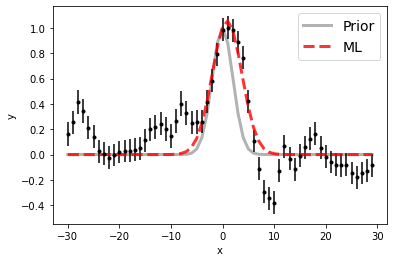

100%|██████████| 15000/15000 [00:14<00:00, 1012.43it/s]


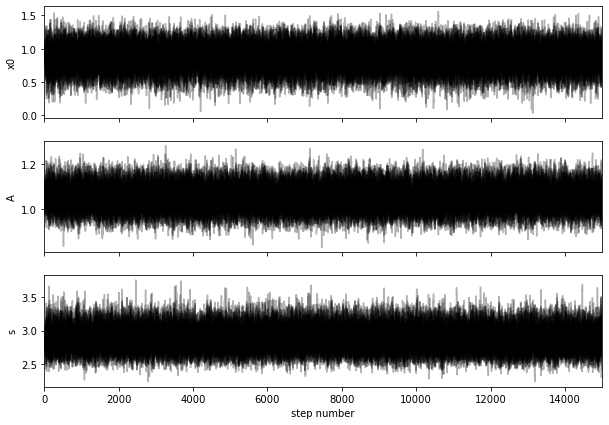

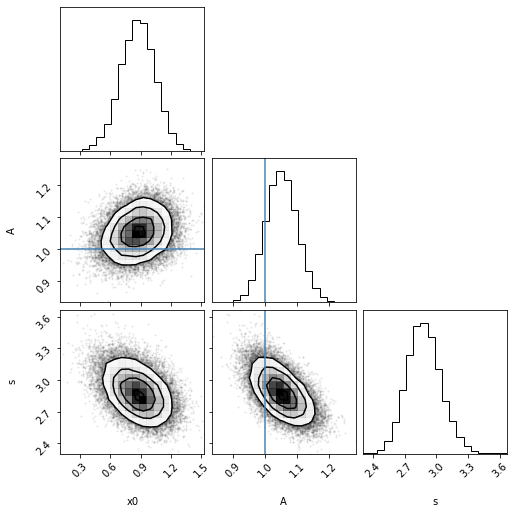

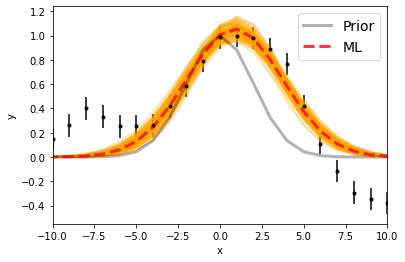

Maximum likelihood estimates:
x0 = 0.881
A = 1.055
s = 2.864


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4861.872647140745 [0.17364884 0.16776485]
A  =  7.306311925920406e-17 [3.42695742e-18 3.48781047e-18]
s  =  2.876576899402109 [0.15266879 0.16444195]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


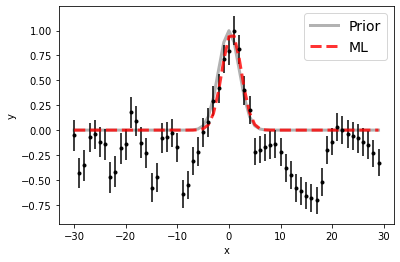

100%|██████████| 15000/15000 [00:14<00:00, 1022.64it/s]


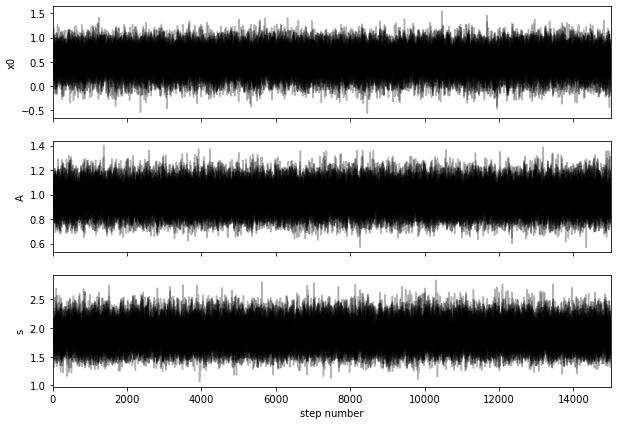

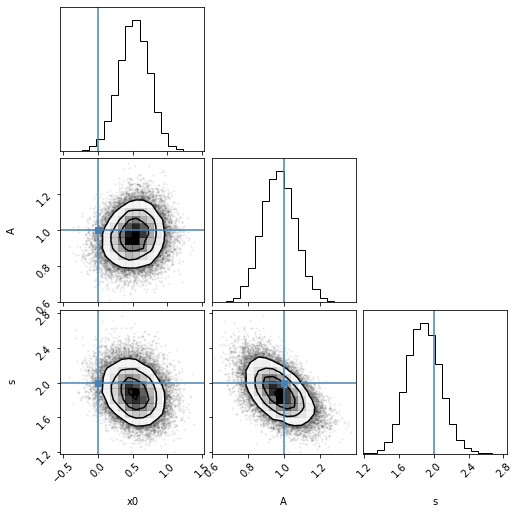

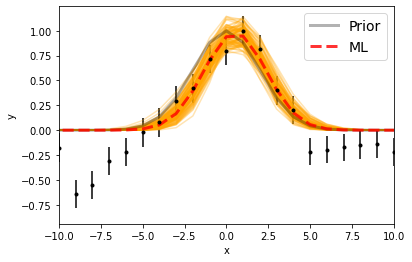

Maximum likelihood estimates:
x0 = 0.524
A = 0.978
s = 1.874


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  5007.520603002193 [0.22181891 0.21669231]
A  =  3.984376436304226e-17 [3.78518543e-18 3.85478394e-18]
s  =  1.8826711796717595 [0.18468323 0.19336569]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros prior:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


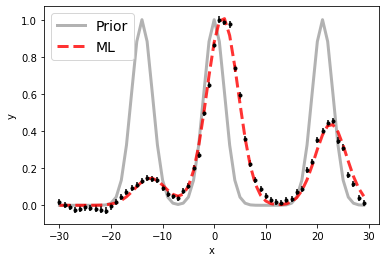

100%|██████████| 15000/15000 [00:22<00:00, 653.48it/s]


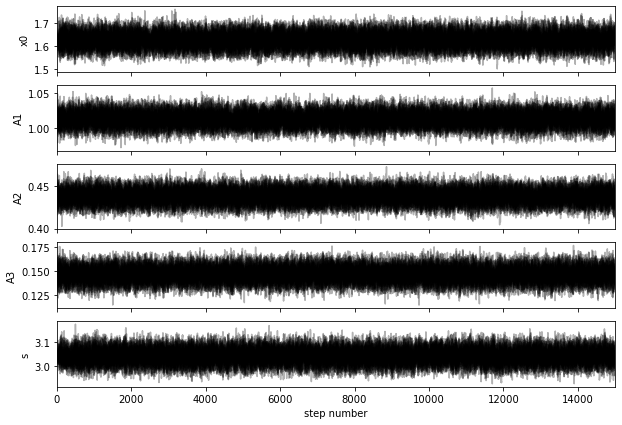

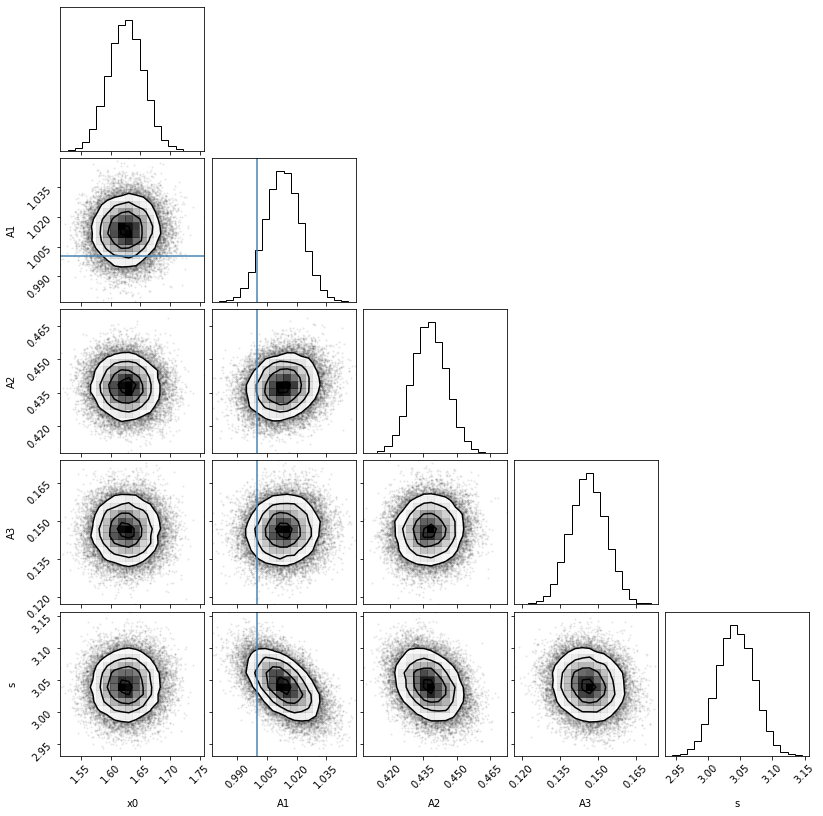

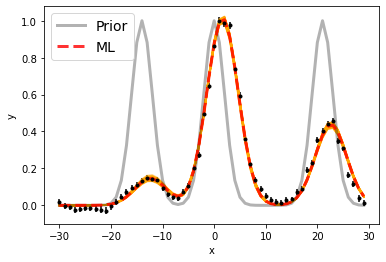

Maximum likelihood estimates:
x0 = 1.626
A1 = 1.013
A2 = 0.438
A3 = 0.146
s = 3.043


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6564.625892129019 6585.625892129019 [0.02871808 0.02890402]
A1, A2   =  2.586717757790154e-16 1.1176357640122494e-16 [2.34290614e-18 2.38388310e-18] [1.93307701e-18 1.95040084e-18]
s  =  3.042346864861888 [0.02791881 0.02852536]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 6

Ajuste en 4861 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


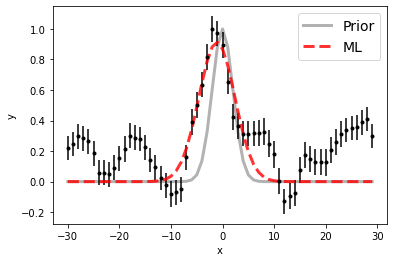

100%|██████████| 15000/15000 [00:14<00:00, 1019.45it/s]


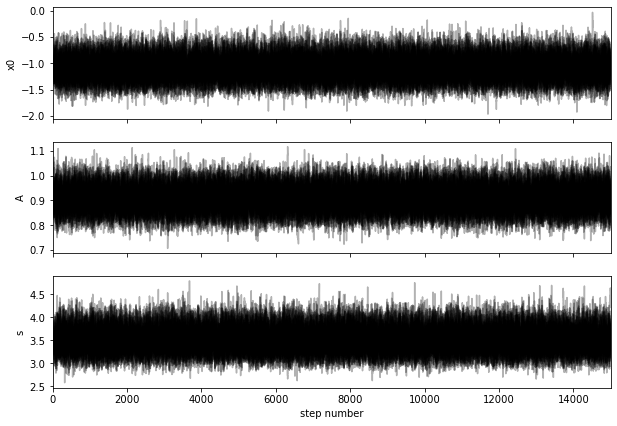

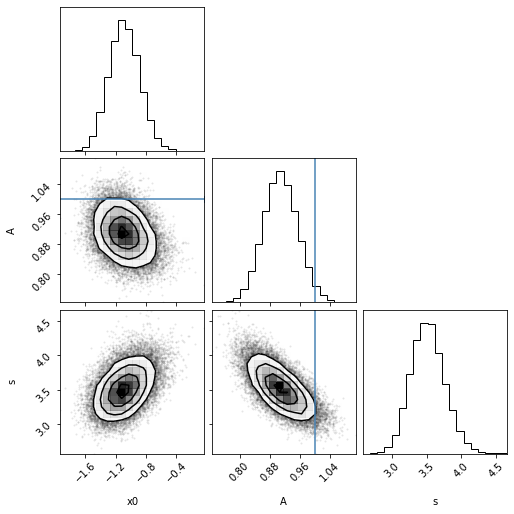

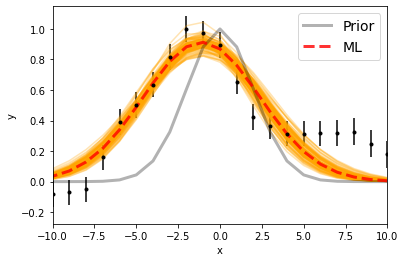

Maximum likelihood estimates:
x0 = -1.099
A = 0.913
s = 3.485


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4859.9098361203605 [0.19782964 0.20457904]
A  =  7.338915415416842e-17 [3.62534228e-18 3.75851661e-18]
s  =  3.5094749009090176 [0.23168399 0.25236168]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


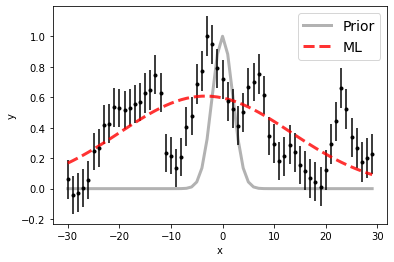

  0%|          | 0/15000 [00:00<?, ?it/s]C:\Users\saruk\anaconda3\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 15000/15000 [00:07<00:00, 2050.07it/s]


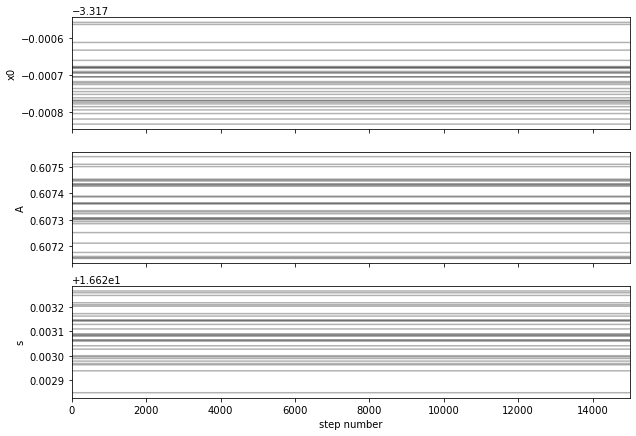

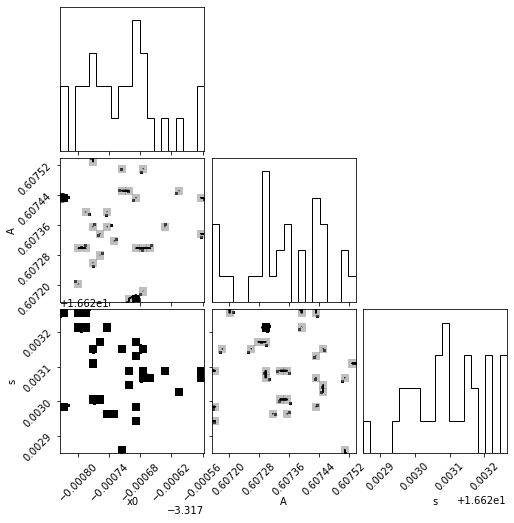

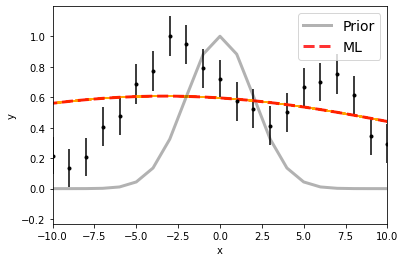

Maximum likelihood estimates:
x0 = -3.318
A = 0.607
s = 16.623


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  5003.682280102108 [6.65926128e-05 5.96478124e-05]
A  =  2.9775612785870263e-17 [6.63434383e-21 5.03842074e-21]
s  =  16.623084594788068 [0.00010653 0.00012385]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros prior:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


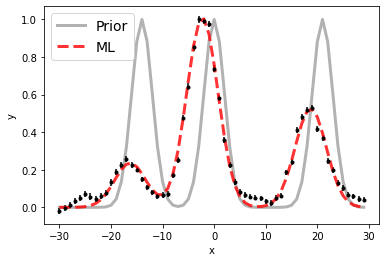

100%|██████████| 15000/15000 [00:22<00:00, 663.01it/s]


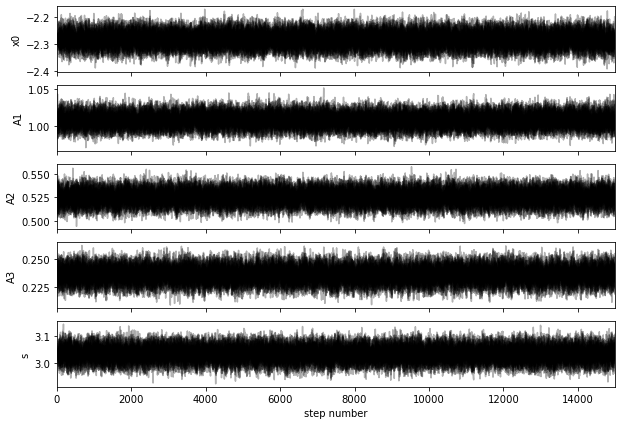

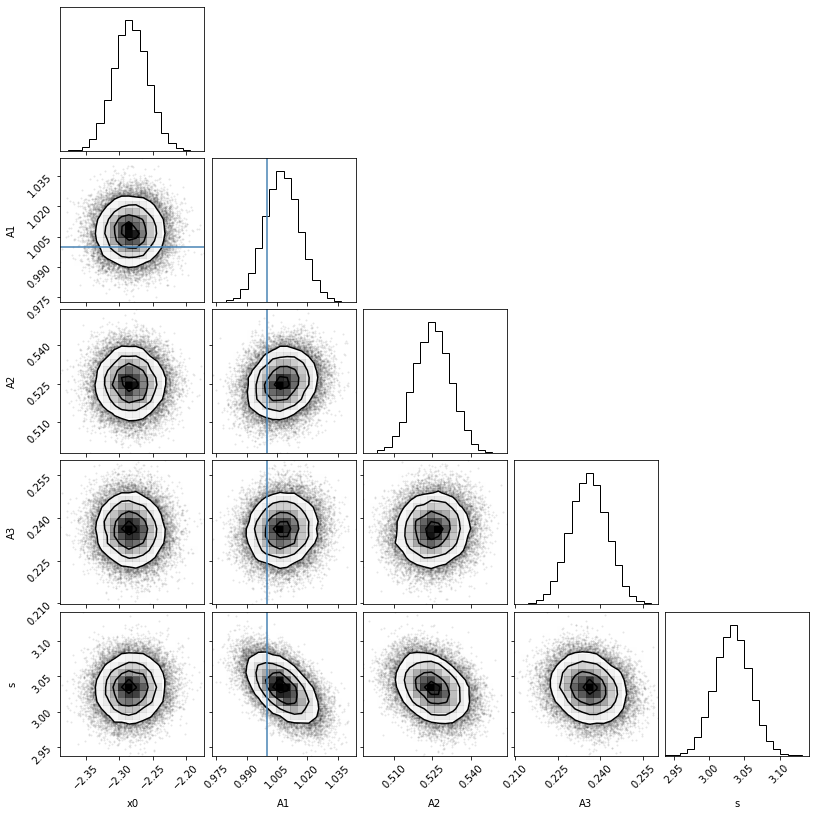

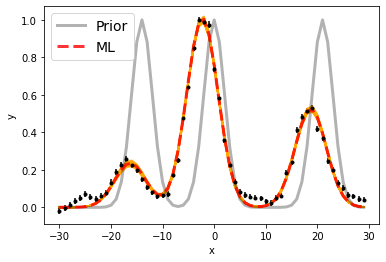

Maximum likelihood estimates:
x0 = -2.283
A1 = 1.008
A2 = 0.525
A3 = 0.236
s = 3.033


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6560.71649988269 6581.71649988269 [0.02524562 0.02553453]
A1, A2   =  2.7275602882567443e-16 1.4212411120652196e-16 [2.34424500e-18 2.37636842e-18] [1.92283860e-18 1.92628151e-18]
s  =  3.033301250669366 [0.02488022 0.0245477 ]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 7

Ajuste en 4861 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


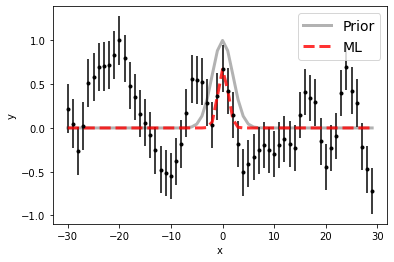

100%|██████████| 15000/15000 [00:14<00:00, 1038.12it/s]


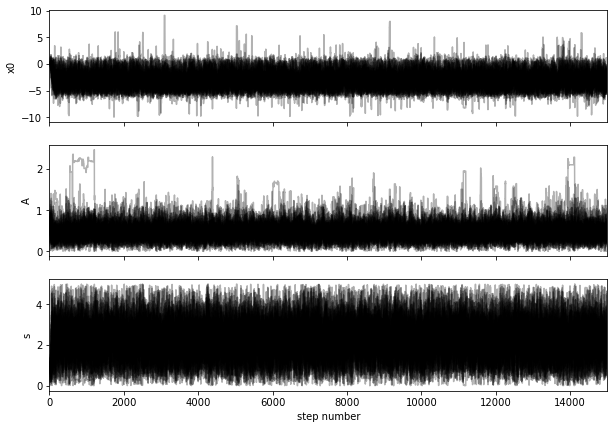

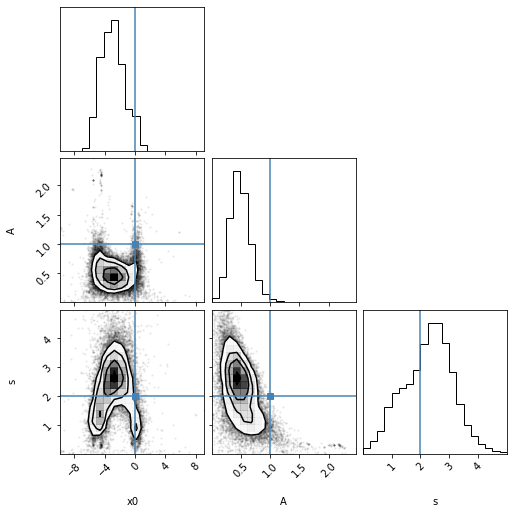

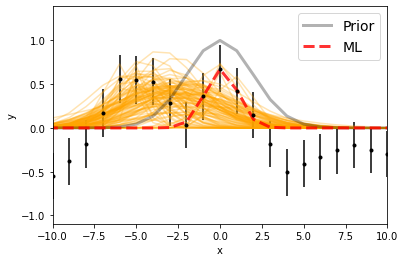

Maximum likelihood estimates:
x0 = 0.084
A = 0.673
s = 0.977


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4857.9871827550005 [1.52907571 1.65155234]
A  =  9.722103423757149e-18 [3.13962840e-18 3.72446317e-18]
s  =  2.343350223594193 [1.01258482 0.73763099]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


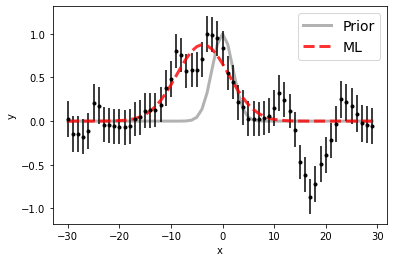

  0%|          | 0/15000 [00:00<?, ?it/s]C:\Users\saruk\anaconda3\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 15000/15000 [00:07<00:00, 2034.99it/s]


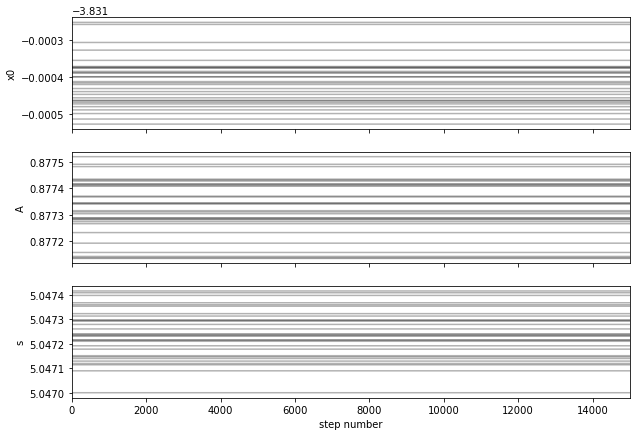

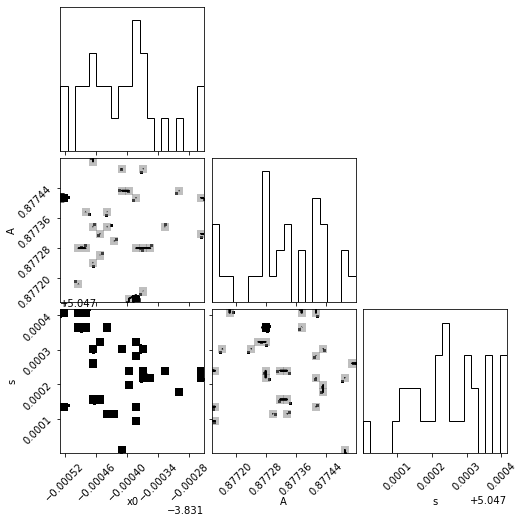

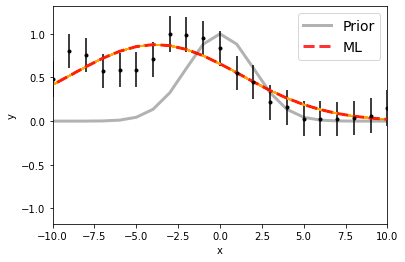

Maximum likelihood estimates:
x0 = -3.831
A = 0.877
s = 5.047


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  5003.168585702699 [6.65926128e-05 5.96478124e-05]
A  =  2.2985611596879865e-17 [3.54542388e-21 2.69255523e-21]
s  =  5.047235722319889 [0.00010653 0.00012385]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros prior:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


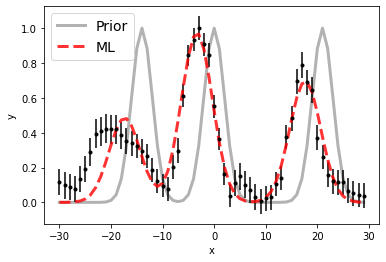

100%|██████████| 15000/15000 [00:22<00:00, 660.00it/s]


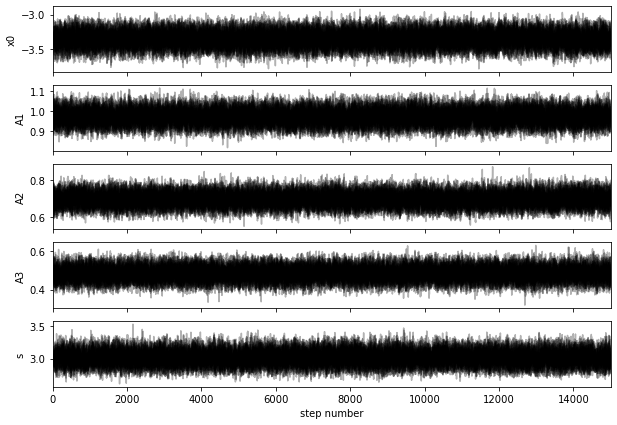

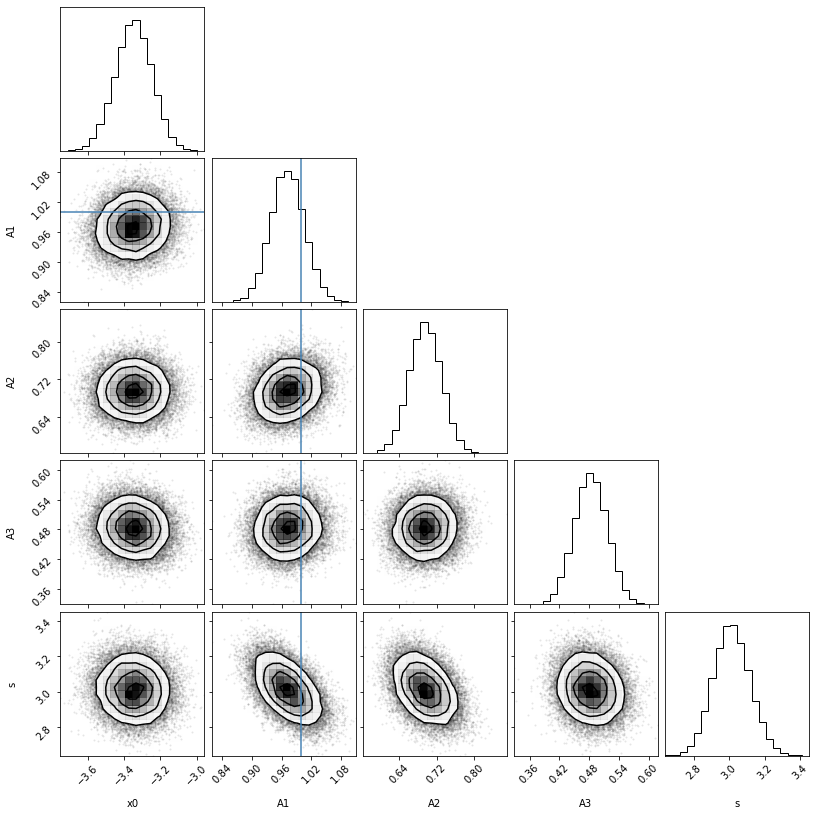

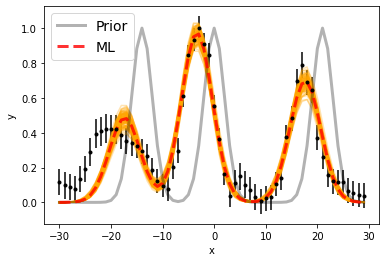

Maximum likelihood estimates:
x0 = -3.348
A1 = 0.973
A2 = 0.697
A3 = 0.484
s = 3.013


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6559.652279286169 6580.652279286169 [0.10050669 0.09988428]
A1, A2   =  4.992962011881129e-17 3.573463637680856e-17 [1.73194717e-18 1.74213151e-18] [1.70061421e-18 1.75857897e-18]
s  =  3.0124832986407055 [0.10009208 0.10327965]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 8

Ajuste en 4861 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


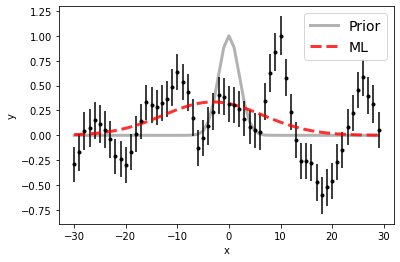

  0%|          | 0/15000 [00:00<?, ?it/s]C:\Users\saruk\anaconda3\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 15000/15000 [00:07<00:00, 2050.22it/s]


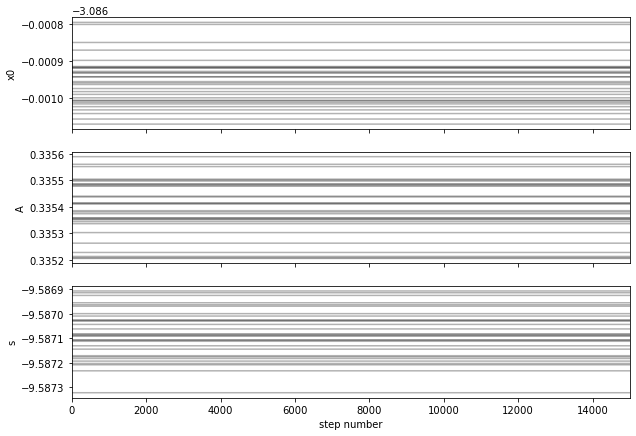

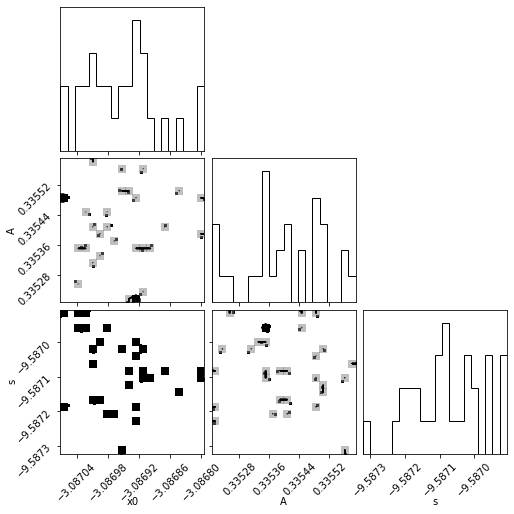

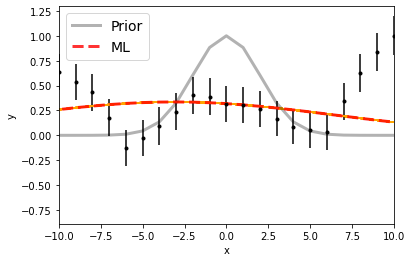

Maximum likelihood estimates:
x0 = -3.087
A = 0.335
s = -9.587


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4857.913042485995 [6.65926128e-05 5.96478124e-05]
A  =  4.591256811427831e-18 [1.85244260e-21 1.40682869e-21]
s  =  -9.587086216164192 [0.00010653 0.00012385]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


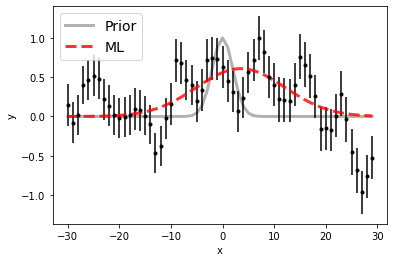

  0%|          | 0/15000 [00:00<?, ?it/s]C:\Users\saruk\anaconda3\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 15000/15000 [00:07<00:00, 2050.56it/s]


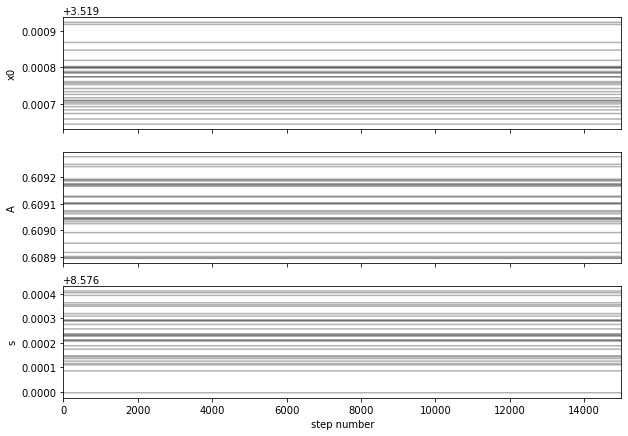

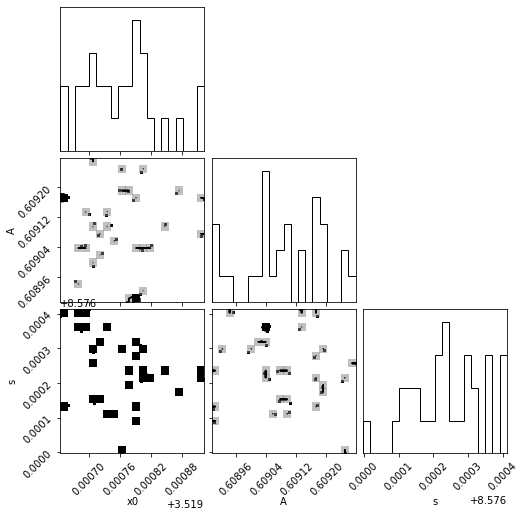

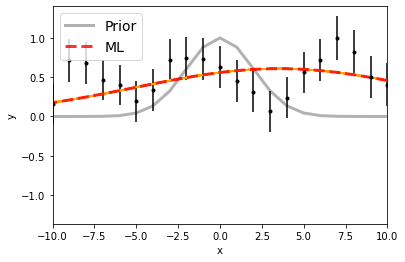

Maximum likelihood estimates:
x0 = 3.520
A = 0.609
s = 8.576


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  5010.519759161297 [6.65926128e-05 5.96478124e-05]
A  =  6.0077318501885785e-18 [1.33476787e-21 1.01368309e-21]
s  =  8.576232142216025 [0.00010653 0.00012385]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros prior:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


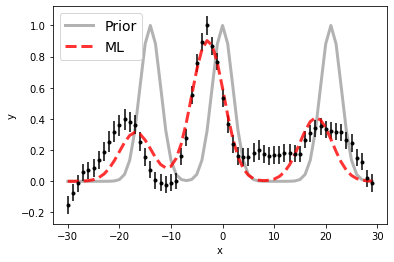

100%|██████████| 15000/15000 [00:22<00:00, 671.64it/s]


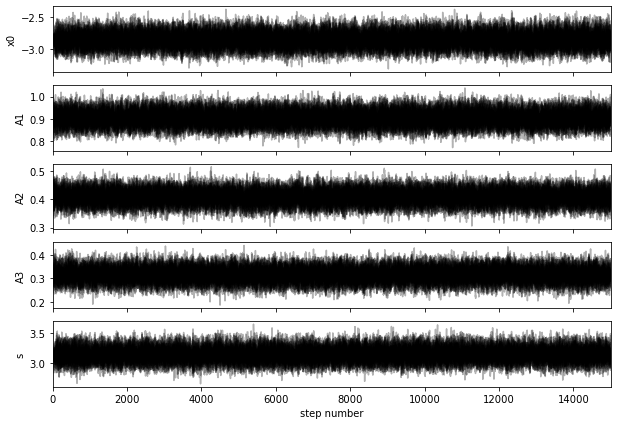

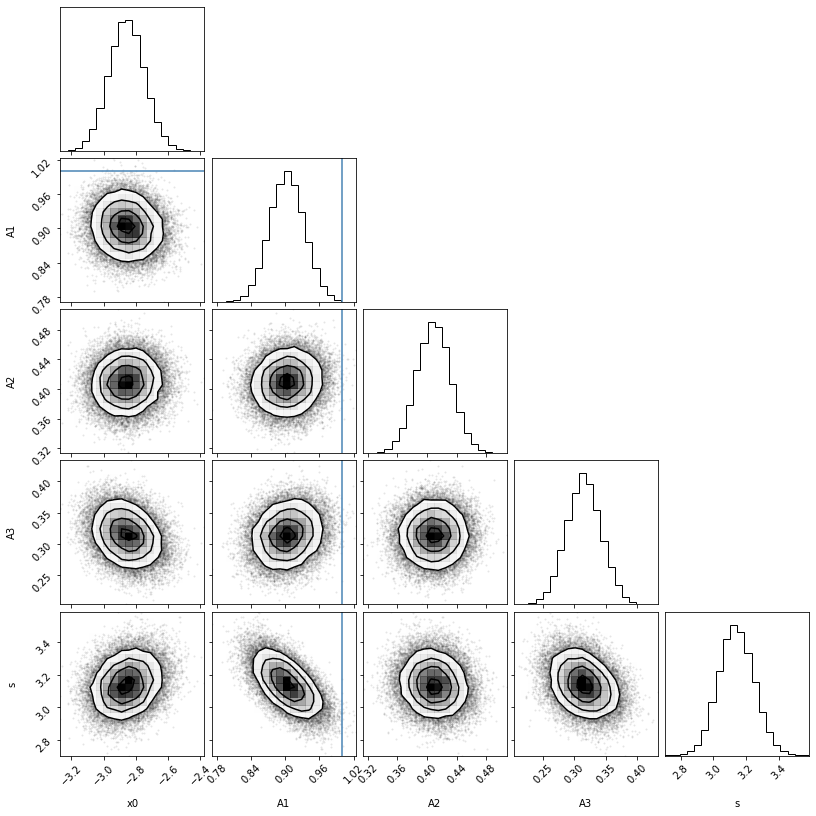

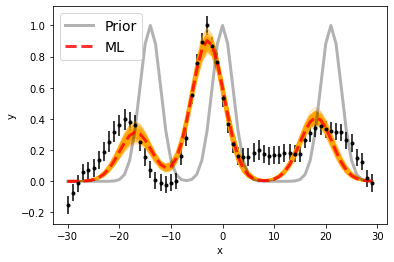

Maximum likelihood estimates:
x0 = -2.856
A1 = 0.904
A2 = 0.409
A3 = 0.315
s = 3.136


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6560.1429541876805 6581.1429541876805 [0.10843058 0.10915129]
A1, A2   =  3.0548966291324934e-17 1.3829056279679785e-17 [1.0286214e-18 1.0438405e-18] [7.79216838e-19 7.73306710e-19]
s  =  3.138141889868788 [0.1051369  0.11023154]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 9

Ajuste en 4861 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


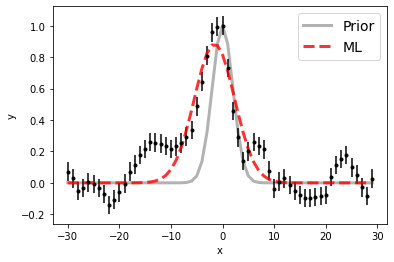

100%|██████████| 15000/15000 [00:14<00:00, 1039.43it/s]


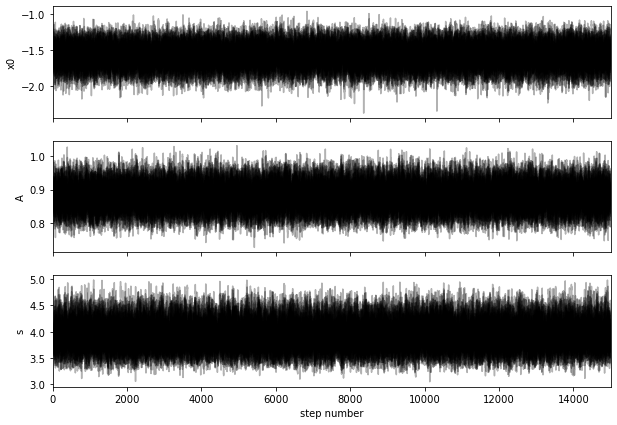

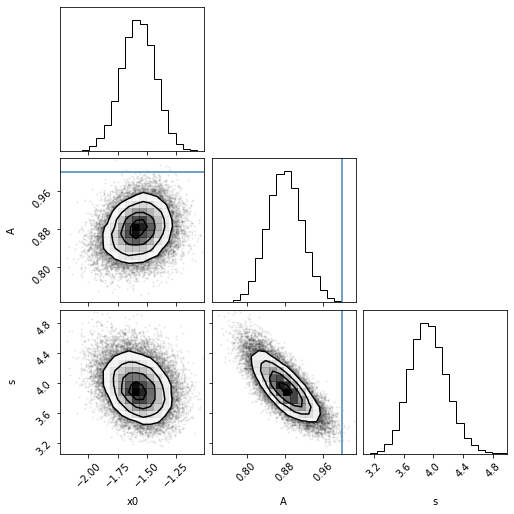

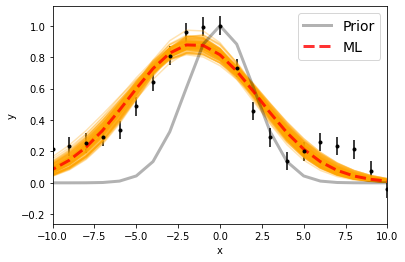

Maximum likelihood estimates:
x0 = -1.566
A = 0.883
s = 3.901


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4859.425820981961 [0.14735057 0.14511081]
A  =  1.1670102561339178e-16 [4.79547496e-18 4.78717270e-18]
s  =  3.924170876009727 [0.23488608 0.25747701]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


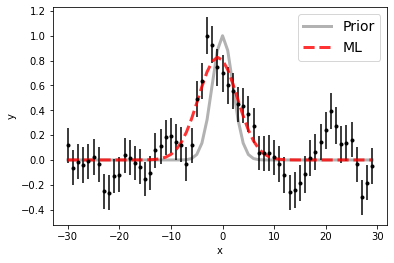

100%|██████████| 15000/15000 [00:14<00:00, 1049.43it/s]


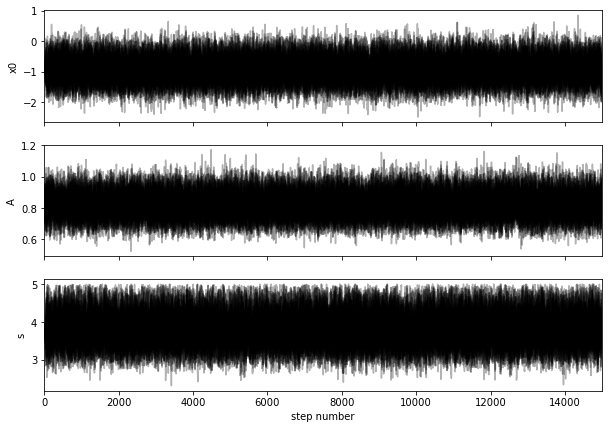

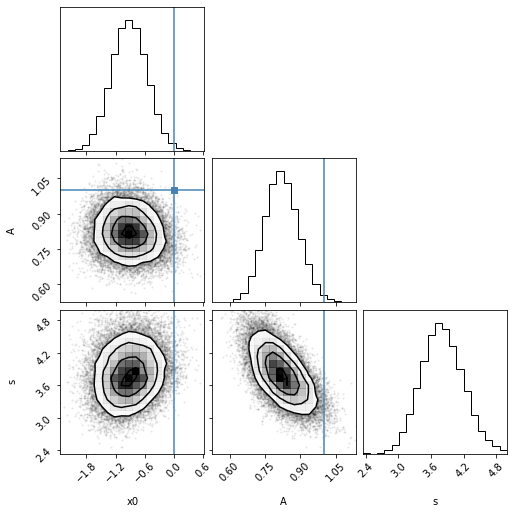

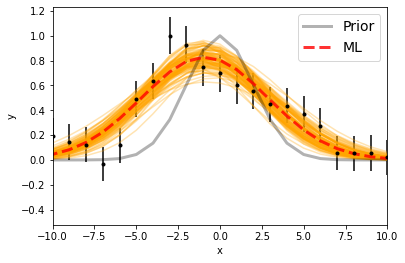

Maximum likelihood estimates:
x0 = -0.913
A = 0.827
s = 3.767


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  5006.07808168593 [0.36316274 0.36837413]
A  =  4.244856368233122e-17 [3.60092528e-18 3.82920878e-18]
s  =  3.7936916999475807 [0.36833616 0.40298258]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros prior:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


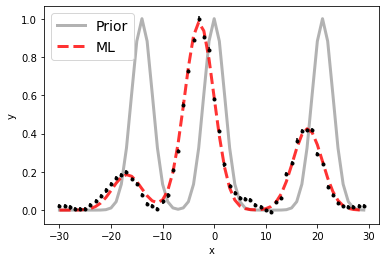

100%|██████████| 15000/15000 [00:22<00:00, 665.93it/s]


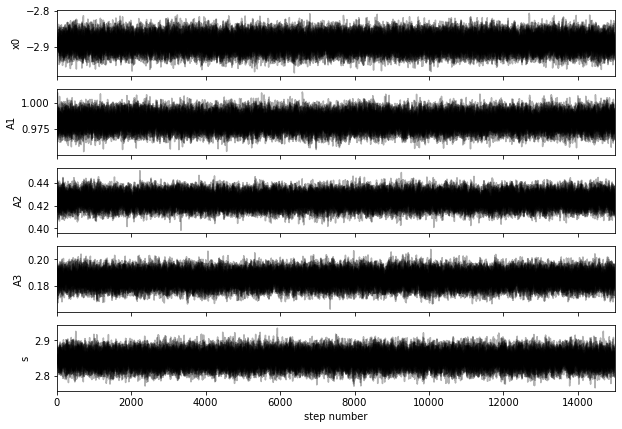

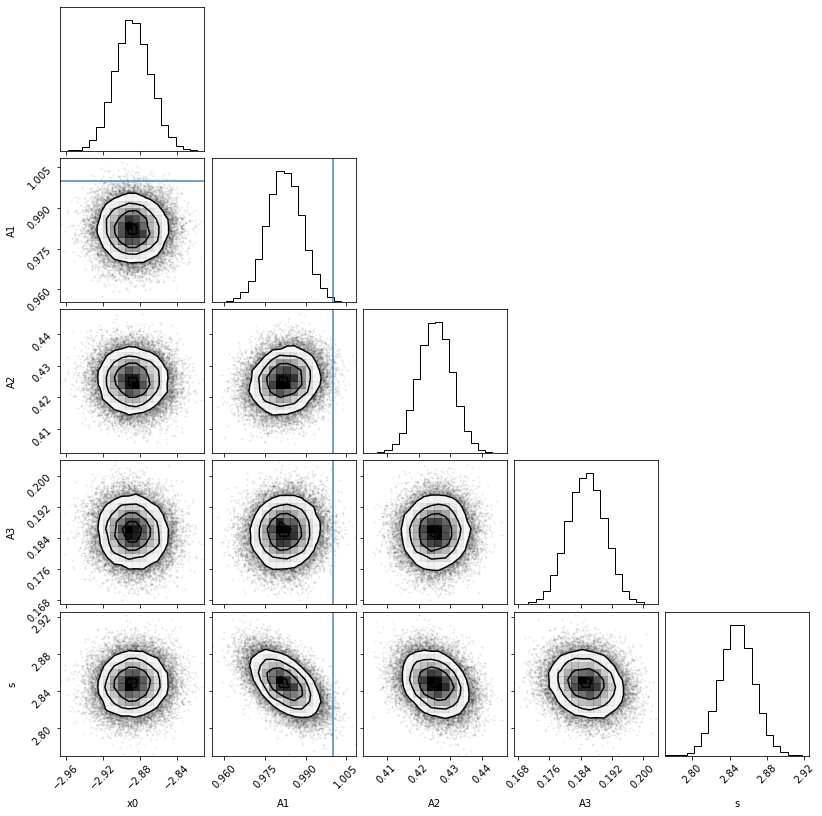

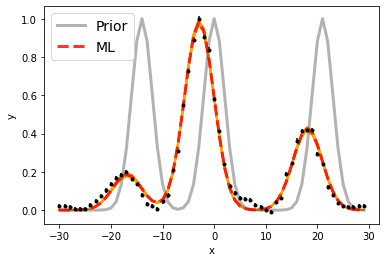

Maximum likelihood estimates:
x0 = -2.888
A1 = 0.982
A2 = 0.425
A3 = 0.185
s = 2.848


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6560.111873852494 6581.111873852494 [0.01887905 0.01960453]
A1, A2   =  4.706151174444256e-16 2.0375595014565094e-16 [3.07311862e-18 3.10932722e-18] [2.51594738e-18 2.52755588e-18]
s  =  2.8478396884848296 [0.01791395 0.01798164]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 10

Ajuste en 4861 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


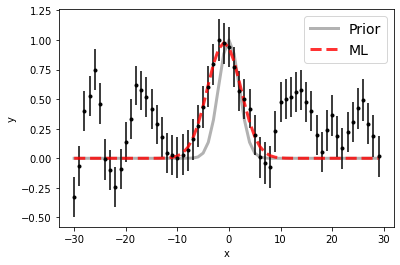

100%|██████████| 15000/15000 [00:14<00:00, 1031.52it/s]


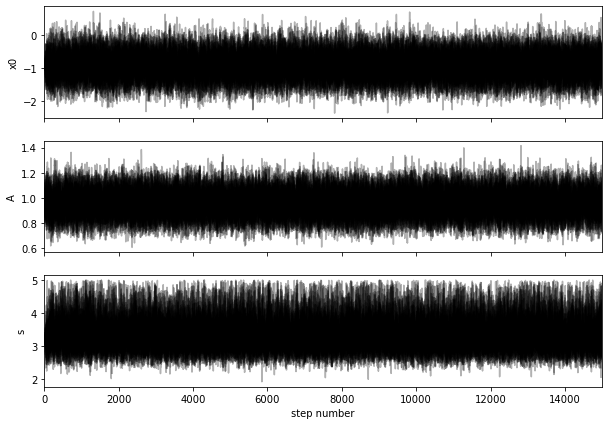

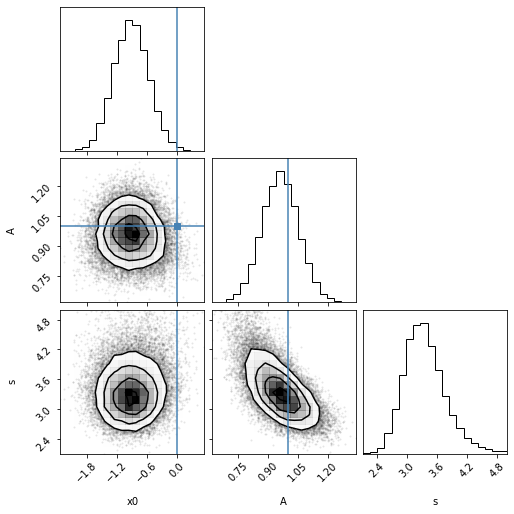

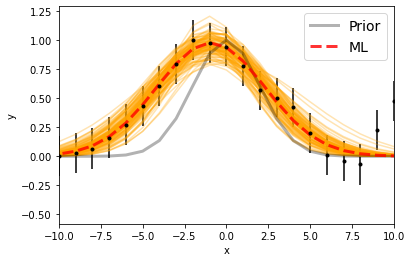

Maximum likelihood estimates:
x0 = -0.926
A = 0.976
s = 3.240


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4860.084158681456 [0.34882866 0.35241747]
A  =  3.2127560541451957e-17 [3.07498241e-18 3.06690968e-18]
s  =  3.3166636675447663 [0.35428653 0.43355703]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


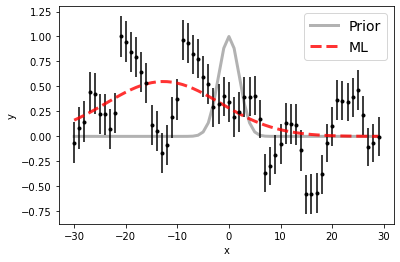

  0%|          | 0/15000 [00:00<?, ?it/s]C:\Users\saruk\anaconda3\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 15000/15000 [00:07<00:00, 2039.16it/s]


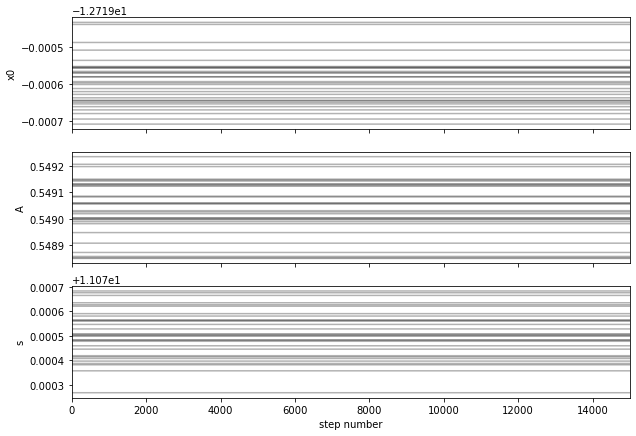

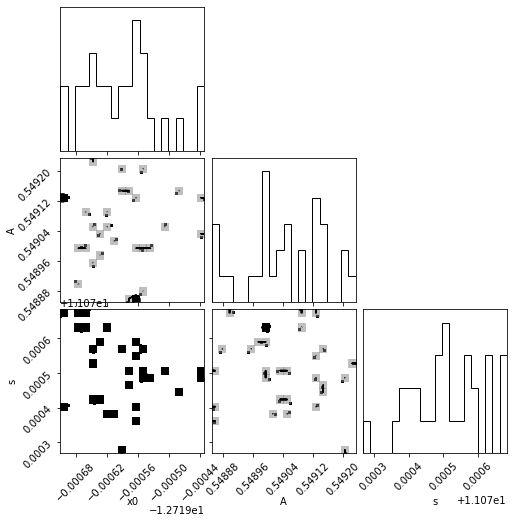

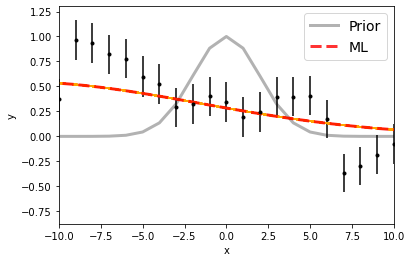

Maximum likelihood estimates:
x0 = -12.720
A = 0.549
s = 11.071


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4994.280404988131 [6.65926128e-05 5.96478124e-05]
A  =  1.50625515900841e-17 [3.71249780e-21 2.81943873e-21]
s  =  11.070503171018121 [0.00010653 0.00012385]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros prior:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


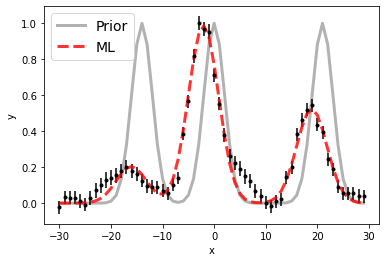

100%|██████████| 15000/15000 [00:22<00:00, 654.56it/s]


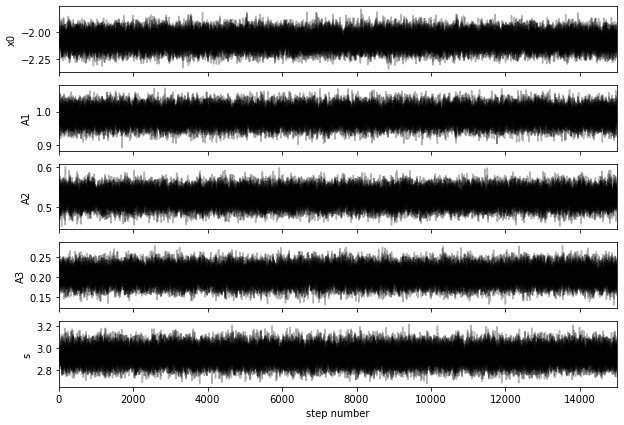

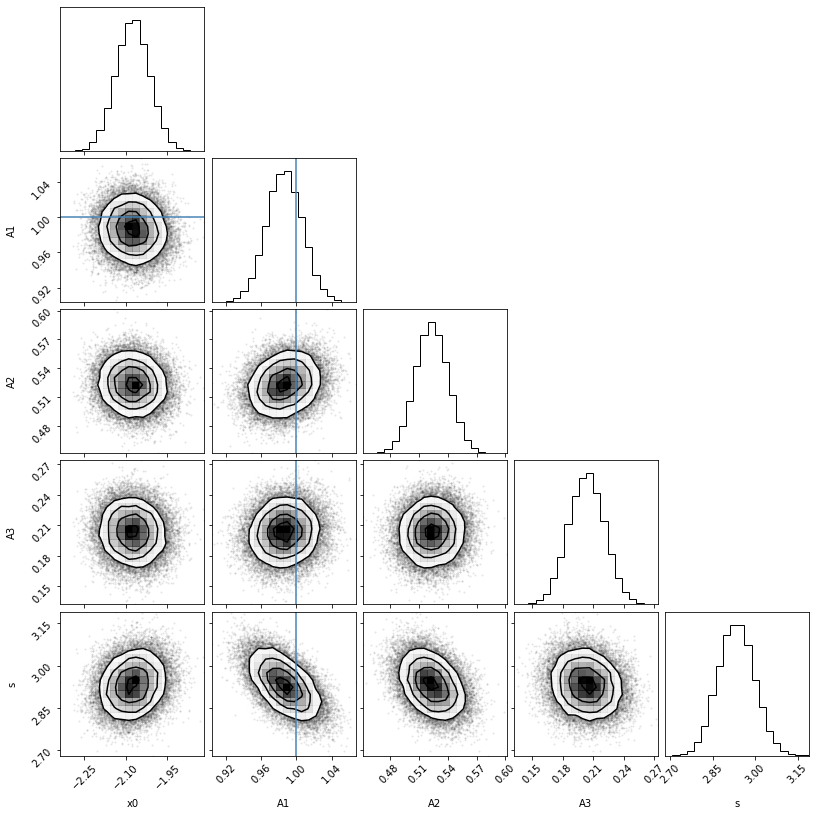

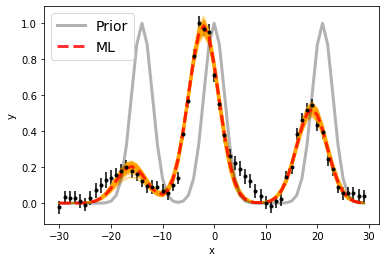

Maximum likelihood estimates:
x0 = -2.075
A1 = 0.987
A2 = 0.523
A3 = 0.204
s = 2.933


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6560.924836615914 6581.924836615914 [0.06105296 0.06033055]
A1, A2   =  9.956700025917826e-17 5.2853615470526935e-17 [2.03392338e-18 2.08549139e-18] [1.69164536e-18 1.72602945e-18]
s  =  2.9323641419636894 [0.06380191 0.06381293]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 11

Ajuste en 4861 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


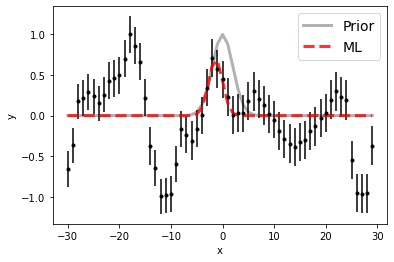

100%|██████████| 15000/15000 [00:14<00:00, 1032.76it/s]


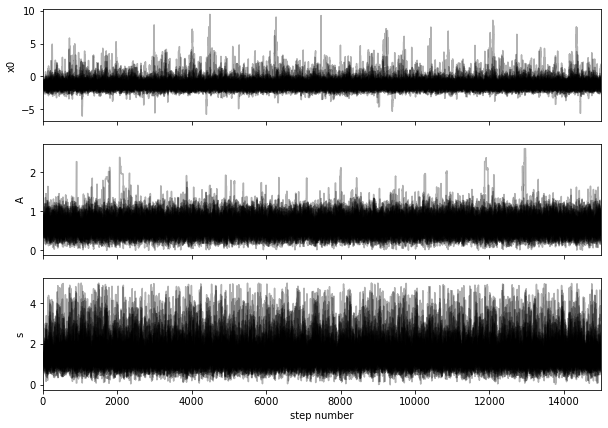

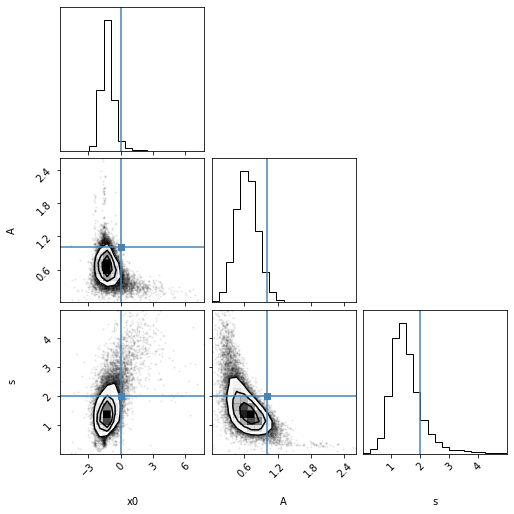

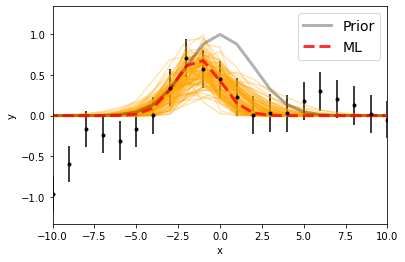

Maximum likelihood estimates:
x0 = -1.322
A = 0.699
s = 1.338


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4859.742648650036 [0.45277215 0.55834906]
A  =  2.0159045404166802e-17 [5.95011895e-18 6.27028137e-18]
s  =  1.4294624100067956 [0.38218463 0.54283094]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


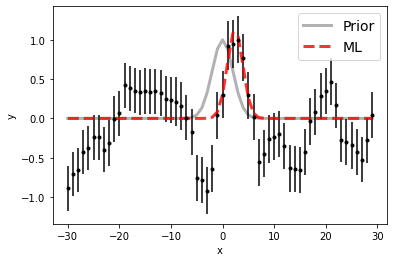

100%|██████████| 15000/15000 [00:14<00:00, 1023.81it/s]


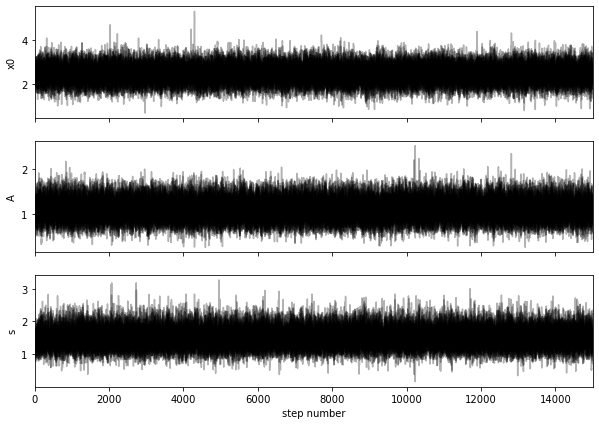

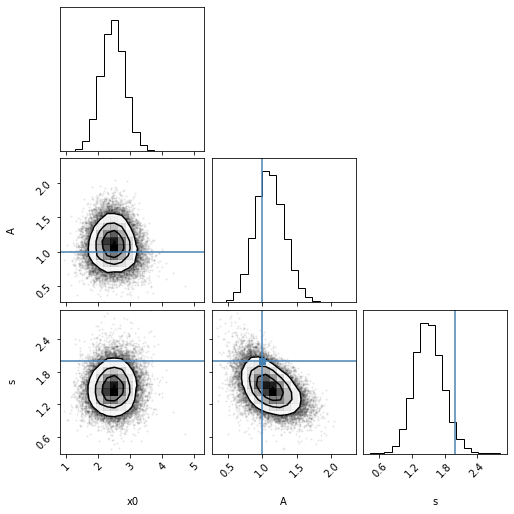

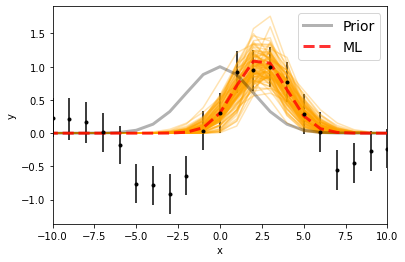

Maximum likelihood estimates:
x0 = 2.434
A = 1.130
s = 1.501


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  5009.451623213998 [0.36807731 0.36734488]
A  =  2.7357365897607155e-17 [5.11080258e-18 5.44433341e-18]
s  =  1.4987312364787777 [0.25036482 0.27337307]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros prior:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


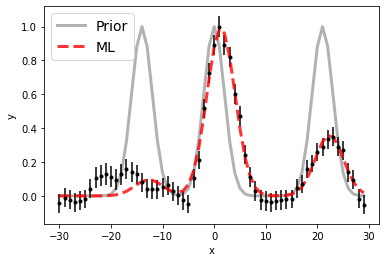

100%|██████████| 15000/15000 [00:22<00:00, 664.25it/s]


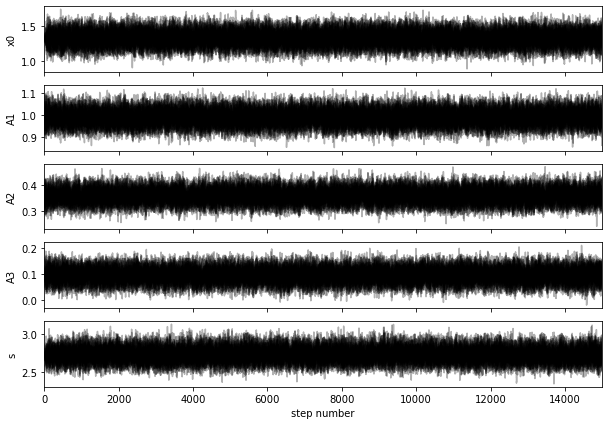

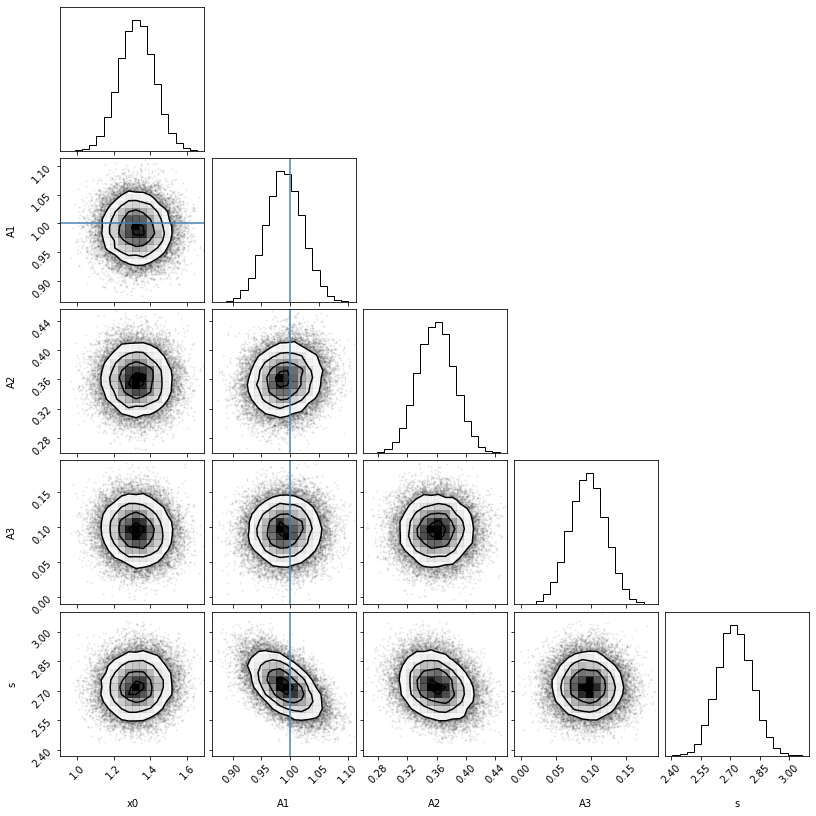

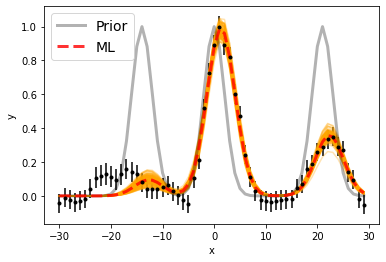

Maximum likelihood estimates:
x0 = 1.323
A1 = 0.991
A2 = 0.359
A3 = 0.096
s = 2.723


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6564.324462803146 6585.324462803146 [0.09441208 0.09568496]
A1, A2   =  8.620257105308556e-17 3.127028176911844e-17 [2.70772073e-18 2.78433199e-18] [2.18027106e-18 2.20754238e-18]
s  =  2.72232939635856 [0.08490821 0.08890746]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 12

Ajuste en 4861 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


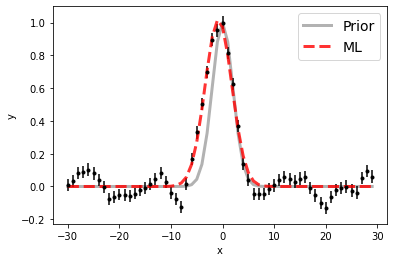

100%|██████████| 15000/15000 [00:14<00:00, 1037.91it/s]


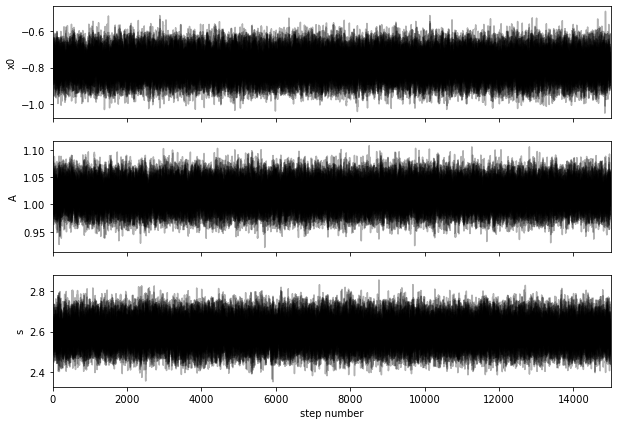

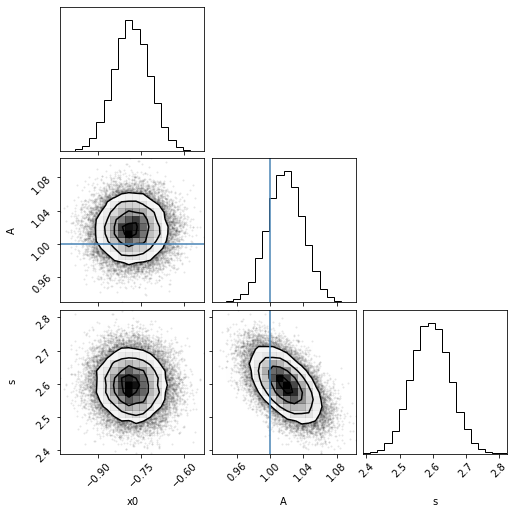

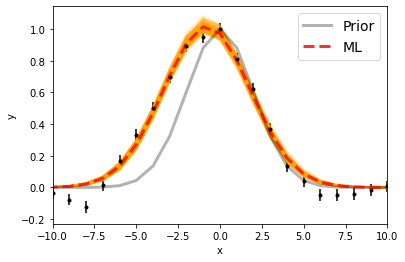

Maximum likelihood estimates:
x0 = -0.784
A = 1.018
s = 2.593


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4860.215845460057 [0.06221124 0.06334744]
A  =  1.777384741943874e-16 [3.71208877e-18 3.75417508e-18]
s  =  2.594918292679621 [0.05692346 0.05779754]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


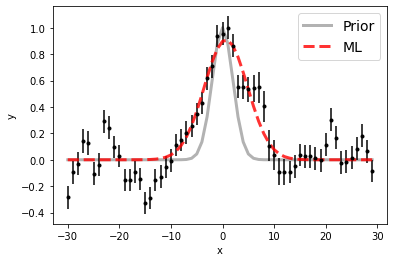

100%|██████████| 15000/15000 [00:14<00:00, 1034.84it/s]


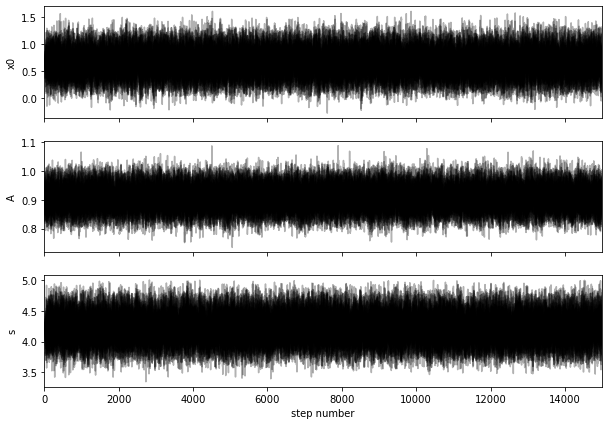

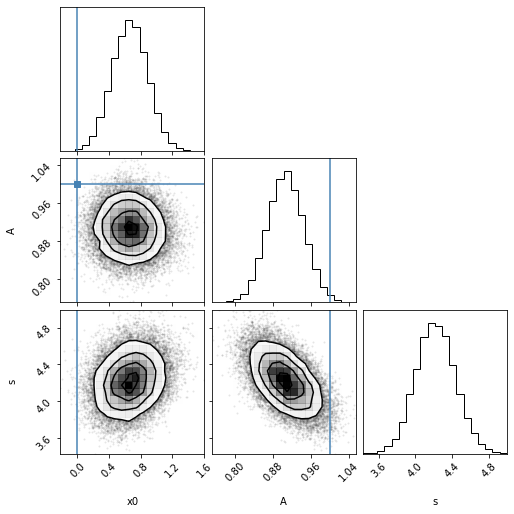

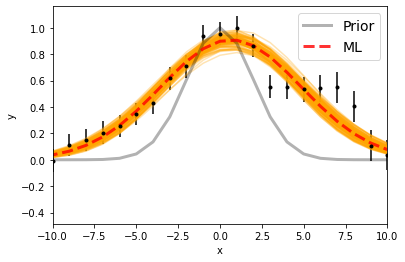

Maximum likelihood estimates:
x0 = 0.655
A = 0.908
s = 4.206


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  5007.6603366795625 [0.22446753 0.22573731]
A  =  6.221502360019944e-17 [2.62274758e-18 2.65649859e-18]
s  =  4.2163062814050125 [0.21021995 0.21510644]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros prior:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


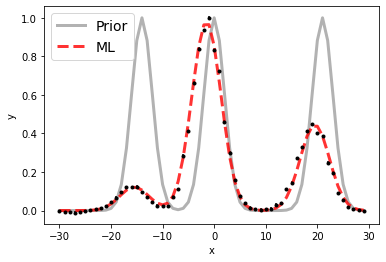

100%|██████████| 15000/15000 [00:22<00:00, 670.35it/s]


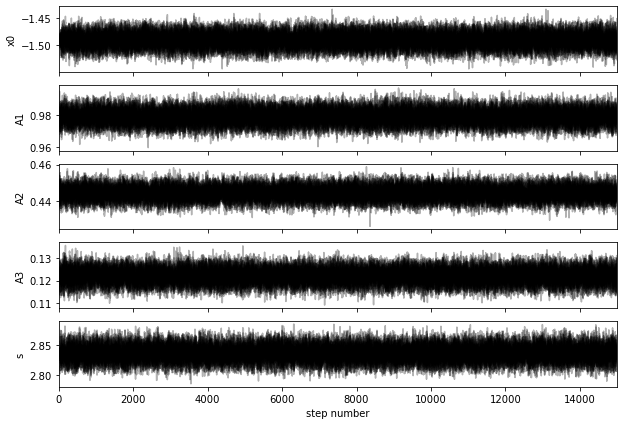

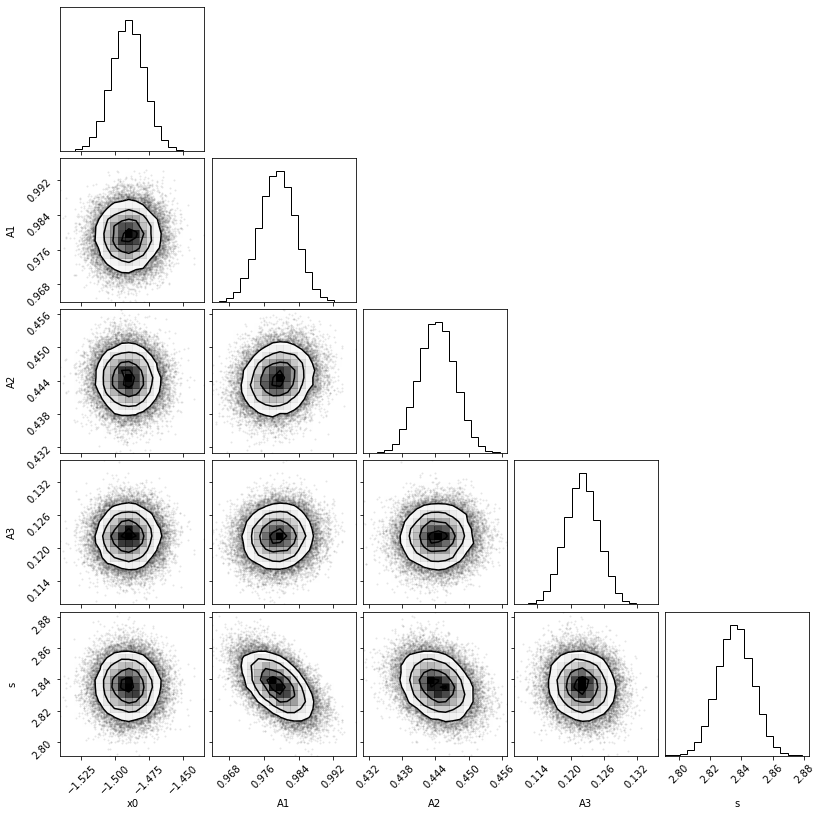

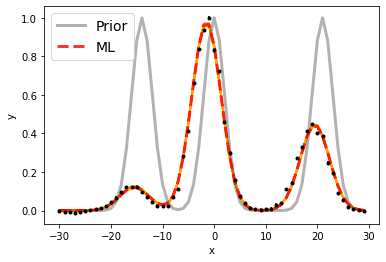

Maximum likelihood estimates:
x0 = -1.491
A1 = 0.979
A2 = 0.444
A3 = 0.122
s = 2.836


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6561.509433742601 6582.509433742601 [0.01207775 0.01193524]
A1, A2   =  5.441582591263973e-16 2.468982418136413e-16 [2.28278028e-18 2.26504714e-18] [1.81426231e-18 1.80680149e-18]
s  =  2.835912338615123 [0.01122492 0.01131072]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 13

Ajuste en 4861 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


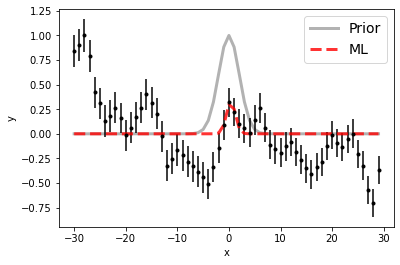

100%|██████████| 15000/15000 [00:12<00:00, 1218.37it/s]


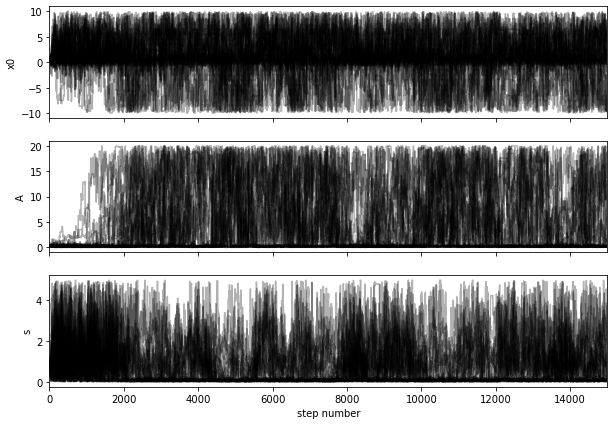

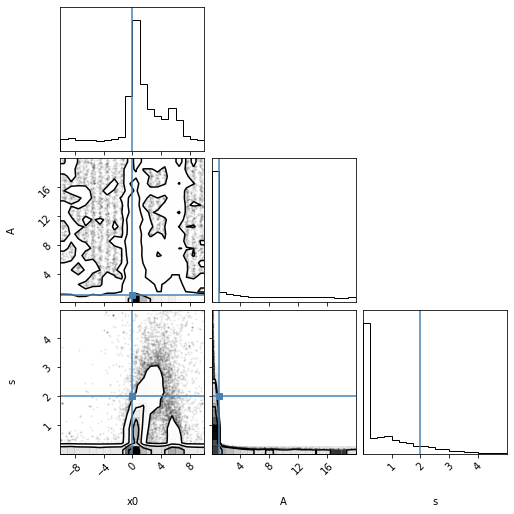

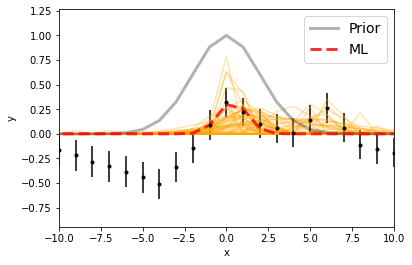

Maximum likelihood estimates:
x0 = 0.379
A = 0.330
s = 0.852


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4861.985639424114 [3.00696574 4.52944022]
A  =  3.4807426698142297e-17 [2.61431163e-17 7.76328901e-16]
s  =  0.2301394813085406 [0.19133174 1.53185265]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros prior:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


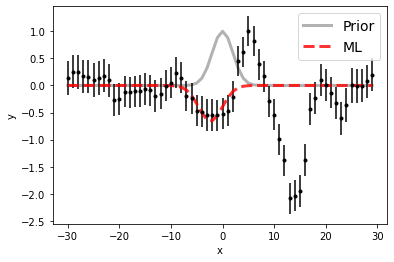

  0%|          | 0/15000 [00:00<?, ?it/s]C:\Users\saruk\anaconda3\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 15000/15000 [00:07<00:00, 2048.77it/s]


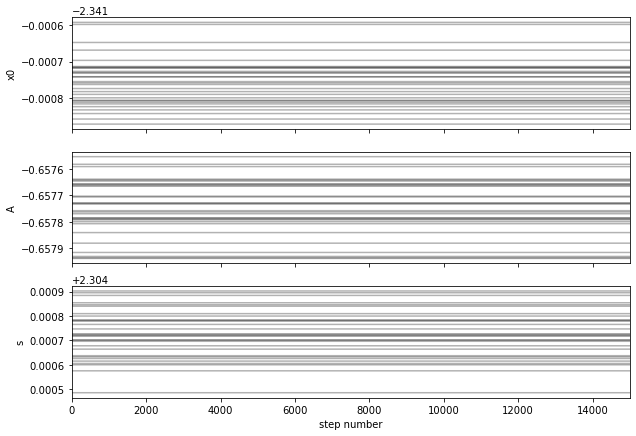

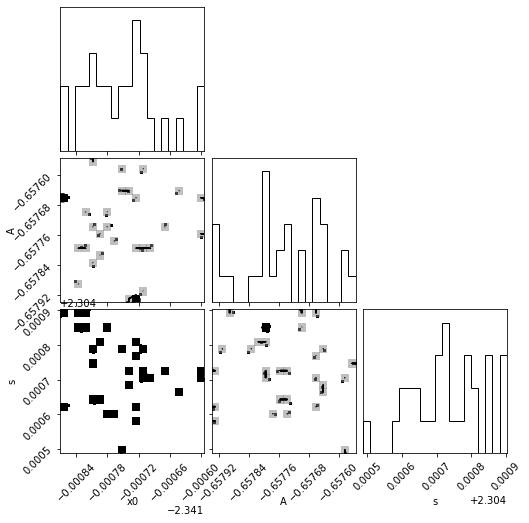

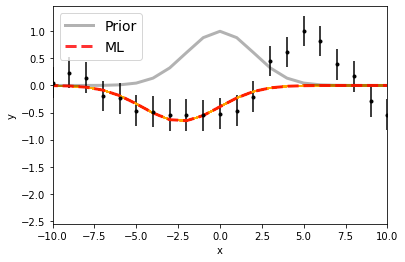

Maximum likelihood estimates:
x0 = -2.342
A = -0.658
s = 2.305


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  5004.6582434496595 [6.65926128e-05 5.96478124e-05]
A  =  -2.0950660976868228e-17 [4.31036520e-21 3.27348627e-21]
s  =  2.3047222819966793 [0.00010653 0.00012385]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros prior:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


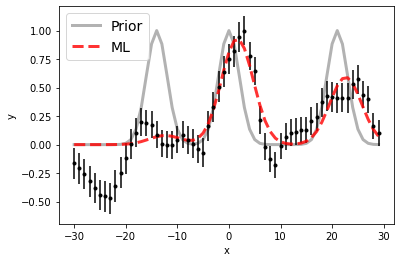

100%|██████████| 15000/15000 [00:23<00:00, 646.55it/s]


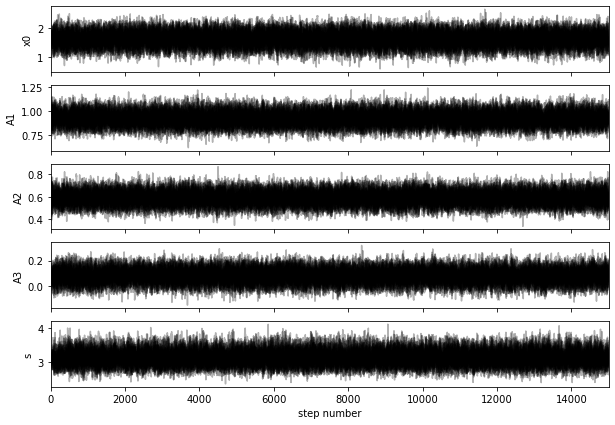

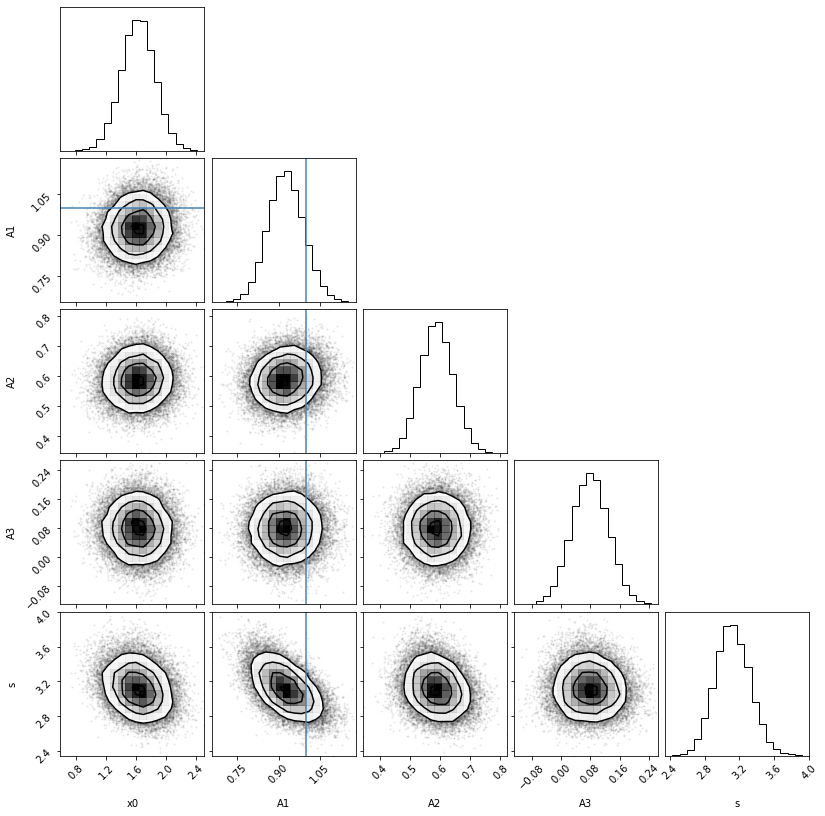

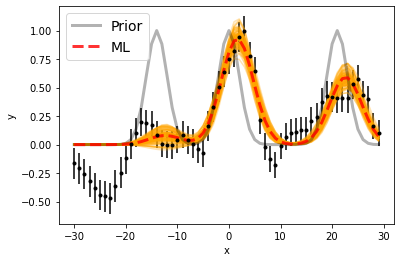

Maximum likelihood estimates:
x0 = 1.628
A1 = 0.929
A2 = 0.591
A3 = 0.080
s = 3.114


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6564.629417276871 6585.629417276871 [0.2262382  0.22375515]
A1, A2   =  5.230816400470205e-17 3.3231910925039474e-17 [3.59852513e-18 3.72662701e-18] [3.05599010e-18 3.09072876e-18]
s  =  3.11634322815219 [0.19104156 0.20324034]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


El programa ha finalizado en 734 s.


In [7]:
instanteInicial = datetime.now()

os.chdir(path+'\\adjusted_spectrum')    
os.getcwd()


Hbeta = 4861
OIII = 5007
Halfa = 6563
NII = 6583

lineas = np.array([Hbeta,OIII,Halfa,NII])
lineas_wave = np.array(np.where((l_obs==Hbeta)|(l_obs==OIII)|(l_obs==Halfa)|(l_obs==NII)))

for j in range(len(l_obs_todos[:,0])):
    l_obs = l_obs_todos[j,:]
    f_obs = f_obs_todos[j,:]
    f_syn = f_syn_todos[j,:]
    e_emit = e_emit_todos[j,:]
    
    print('AJUSTANDO ESPECTRO',j)
    print()
    
    
    ##################################### Hb y OIII
    x0_1 = []
    A_1 = []
    s_1 = []
    e_x0_1 = []
    e_A_1 = []
    e_s_1 = []
    lineas_1 = lineas[0:2]
    lineas_wave_1 = lineas_wave[0,0:2]
    for i in range(len(lineas_1)):
        lim_i=lineas_wave_1[i]-30; lim_i=int(lim_i)
        lim_f=lineas_wave_1[i]+30; lim_f=int(lim_f)
        
        # Choose the "true" parameters.
        data = f_obs-f_syn
        wave = l_obs[lim_i:lim_f]
        flux = data[lim_i:lim_f]
        ymax = np.max(flux)
        x = wave-lineas_1[i]
        y = flux/ymax
        yerr = e_emit[lim_i:lim_f]/ymax
        linea = lineas_1[i]
        
        def gaussian(x, a, x0, sigma):
            return a*np.exp(-(x-x0)**2/(2*sigma**2))
            
        popt, pcov = curve_fit(gaussian, wave, flux, p0=[1, 0, 2])
        
        A_true,x0_true,s_true=popt
        print('Ajuste en', lineas_1[i],'nm:')
        print()
        print('Parámetros prior:')
        print(A_true,x0_true,s_true)
        print()
        
        
        # Maximum likehood estimation:
        def log_likelihood(theta, x, y, yerr):
            x0, A, s = theta
            model = A * np.exp( -(x-x0)**2 / (2 * s**2) )
            sigma2 = yerr ** 2 #+ model ** 2 
            return -0.5 * np.sum((y - model) ** 2 / sigma2 )#+ np.log(sigma2))
        
        np.random.seed(42)
        nll = lambda *args: -log_likelihood(*args)
        initial = np.array([x0_true, A_true, s_true]) + 0.1 * np.random.randn(3)
        soln = minimize(nll, initial, args=(x, y, yerr))
        x0_ml, A_ml, s_ml = soln.x
        
        
        plt.errorbar(x, y, yerr=yerr, fmt=".k", capsize=0)
        plt.plot(x, A_true * np.exp(-(x-x0_true)**2 / (2*s_true**2))  , "k", alpha=0.3, lw=3, label="Prior")
        plt.plot(x, A_ml * np.exp(-(x-x0_ml)**2 / (2*s_ml**2))  , "--r", alpha=0.8, lw=3, label="ML")
        plt.legend(fontsize=14)
        #plt.xlim(-10, 10)
        plt.xlabel('x')
        plt.ylabel('y');
        plt.show()
        
        
        # Marginalization and uncertainty:
        def log_prior(theta):
            x0, A, s = theta
            if -10. < x0 < 10. and 0.0 < A < 20.0 and 0.0 < s < 5.0:
                return 0.0
            return -np.inf
        
        def log_probability(theta, x, y, yerr):
            lp = log_prior(theta)
            if not np.isfinite(lp):
                return -np.inf
            return lp + log_likelihood(theta, x, y, yerr)
        
        pos = soln.x + 1e-4 * np.random.randn(30, 3)
        nwalkers, ndim = pos.shape
        
        sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability, args=(x, y, yerr))
        sampler.run_mcmc(pos, 15000, progress=True);
        
        
        fig, axes = plt.subplots(3, figsize=(10, 7), sharex=True)
        samples = sampler.get_chain()
        labels = ["x0", "A", "s"]
        for i in range(ndim):
            ax = axes[i]
            ax.plot(samples[:, :, i], "k", alpha=0.3)
            ax.set_xlim(0, len(samples))
            ax.set_ylabel(labels[i])
        #    ax.yaxis.set_label_coords(-0.1, 0.5)
        
        axes[-1].set_xlabel("step number");
        plt.show()
        
        
        flat_samples = sampler.get_chain(discard=100, thin=15, flat=True)
        #print(flat_samples.shape)
        
        
        # Resultados
        fig = corner.corner(flat_samples, labels=labels, truths=[x0_true, A_true, s_true]);
        plt.show()
        
        inds = np.random.randint(len(flat_samples), size=100)
        plt.errorbar(x, y, yerr=yerr, fmt=".k", capsize=0)
        for ind in inds:
            sample = flat_samples[ind]
            plt.plot(x, sample[1] * np.exp(-(x-sample[0])**2 / (2*sample[2]**2)) , color='orange', alpha=0.3)
        plt.plot(x, A_true * np.exp(-(x-x0_true)**2 / (2*s_true**2))  , "k", alpha=0.3, lw=3, label="Prior")
        plt.plot(x, A_ml * np.exp(-(x-x0_ml)**2 / (2*s_ml**2))  , "--r", alpha=0.8, lw=3, label="ML")
        plt.legend(fontsize=14)
        plt.xlim(-10, 10)
        plt.xlabel('x')
        plt.ylabel('y');
        
        plt.show()
        
        print('Maximum likelihood estimates:')
        print("x0 = {0:.3f}".format(x0_ml))
        print("A = {0:.3f}".format(A_ml))
        print("s = {0:.3f}".format(s_ml))
        
        #
        datos = []
        errores = []
        for i in range(ndim):
            mcmc = np.percentile(flat_samples[:, i], [16, 50, 84])
            q = np.diff(mcmc)
            txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
            txt = txt.format(mcmc[1], q[0], q[1], labels[i])
            display(Math(txt))
            datos.append(mcmc[1])
            errores.append(q[:])
            
        datos = np.array(datos)
        errores = np.array(errores)
        x0 = datos[0]+linea
        A = datos[1]*ymax
        s = datos[2]
        e_x0 = errores[0]
        e_A = errores[1]*ymax
        e_s = errores[2]
        print('\nParámetros obtenidos:')
        print('x0 = ', x0, e_x0)
        print('A  = ', A, e_A)
        print('s  = ', s, e_s)
        print('\n-------------------------------------------------------------------------------------------')
        print()
        
        x0_1.append(x0)
        A_1.append(A)
        s_1.append(s)
        e_x0_1.append(e_x0)
        e_A_1.append(e_A)
        e_s_1.append(e_s)
    
    x0_1 = np.array(x0_1)
    A_1 = np.array(A_1)
    s_1 = np.array(s_1)
    e_x0_1 = np.array(e_x0_1)
    e_A_1 = np.array(e_A_1)
    e_s_1 = np.array(e_s_1)
    
        
    ##################################### Ha y NII
    
    d1 = 21
    d2 = 14
    
    x0_2 = []
    A1_2 = []
    A2_2 = []
    A3_2 = []
    s_2 = []
    e_x0_2 = []
    e_A1_2 = []
    e_A2_2 = []
    e_A3_2 = []
    e_s_2 = []
    lim_i = lineas_wave[0,2]-30; lim_i=int(lim_i)
    lim_f = lineas_wave[0,2]+30; lim_f=int(lim_f)
    
    # Choose the "true" parameters.
    data = f_obs-f_syn
    wave = l_obs[lim_i:lim_f]
    flux = data[lim_i:lim_f]
    ymax = np.max(flux)
    x = wave-lineas[2]
    y = flux/ymax
    yerr = e_emit[lim_i:lim_f]/ymax
    linea = lineas[2]
    
    def gaussian_2(x, a1 ,a2,a3, x0, sigma):
        return a1*np.exp(-(x-x0)**2/(2*sigma**2))+a2*np.exp(-(x-(x0+d1))**2/(2*sigma**2))+a3*np.exp(-(x-(x0-d2))**2/(2*sigma**2))
        
    popt, pcov = curve_fit(gaussian_2, wave, flux, p0=[1,1,1, 0, 2])
    
    A1_true,A2_true,A3_true,x0_true,s_true=popt
    print('Ajuste en', lineas[2],'nm:')
    print()
    print('Parámetros prior:')
    print(A1_true,A2_true,A3_true,x0_true,s_true)
    print()
    
    
    # Maximum likehood estimation:
    def log_likelihood(theta, x, y, yerr):
        x0, A1,A2,A3, s = theta
        model = A1 * np.exp( -(x-x0)**2 / (2 * s**2) )+A2 * np.exp( -(x-(x0+d1))**2 / (2 * s**2) )+A3 * np.exp( -(x-(x0-d2))**2 / (2 * s**2) )
        sigma2 = yerr ** 2 #+ model ** 2 
        return -0.5 * np.sum((y - model) ** 2 / sigma2 )#+ np.log(sigma2))
    
    np.random.seed(42)
    nll = lambda *args: -log_likelihood(*args)
    initial = np.array([x0_true, A1_true,A2_true,A3_true, s_true]) + 0.1 * np.random.randn(5)
    soln = minimize(nll, initial, args=(x, y, yerr))
    x0_ml, A1_ml,A2_ml,A3_ml, s_ml = soln.x
    
    
    plt.errorbar(x, y, yerr=yerr, fmt=".k", capsize=0)
    plt.plot(x, A1_true * np.exp(-(x-x0_true)**2 / (2*s_true**2))+ A2_true * np.exp(-(x-(x0_true+d1))**2 / (2*s_true**2))+ A3_true * np.exp(-(x-(x0_true-d2))**2 / (2*s_true**2))    , "k", alpha=0.3, lw=3, label="Prior")
    plt.plot(x, A1_ml * np.exp(-(x-x0_ml)**2 / (2*s_ml**2))+A2_ml * np.exp(-(x-(x0_ml+d1))**2 / (2*s_ml**2))+A3_ml * np.exp(-(x-(x0_ml-d2))**2 / (2*s_ml**2))  , "--r", alpha=0.8, lw=3, label="ML")
    plt.legend(fontsize=14)
    #plt.xlim(-10, 10)
    plt.xlabel('x')
    plt.ylabel('y');
    plt.show()
    
    
    # Marginalization and uncertainty:
    def log_prior(theta):
        x0, A1,A2,A3, s = theta
        if -10. < x0 < 10. and 0.0 < A1 < 20.0 and 0.0 < s < 5.0:
            return 0.0
        return -np.inf
        if -10. < x0 < 10. and 0.0 < A2 < 20.0 and 0.0 < s < 5.0:
            return 0.0
        return -np.inf
        if -10. < x0 < 10. and 0.0 < A3 < 20.0 and 0.0 < s < 5.0:
            return 0.0
        return -np.inf
    
    def log_probability(theta, x, y, yerr):
        lp = log_prior(theta)
        if not np.isfinite(lp):
            return -np.inf
        return lp + log_likelihood(theta, x, y, yerr)
    
    pos = soln.x + 1e-4 * np.random.randn(30, 5)
    nwalkers, ndim = pos.shape
    
    sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability, args=(x, y, yerr))
    sampler.run_mcmc(pos, 15000, progress=True);
    
    
    fig, axes = plt.subplots(5, figsize=(10, 7), sharex=True)
    samples = sampler.get_chain()
    labels = ["x0", "A1","A2","A3", "s"]
    for i in range(ndim):
        ax = axes[i]
        ax.plot(samples[:, :, i], "k", alpha=0.3)
        ax.set_xlim(0, len(samples))
        ax.set_ylabel(labels[i])
    #    ax.yaxis.set_label_coords(-0.1, 0.5)
    
    axes[-1].set_xlabel("step number");
    plt.show()
    
    
    flat_samples = sampler.get_chain(discard=100, thin=15, flat=True)
    #print(flat_samples.shape)
    
    
    # Resultados
    fig = corner.corner(flat_samples, labels=labels, truths=[x0_true, A1_true, A2_true, A3_true, s_true]);
    plt.show()
    
    inds = np.random.randint(len(flat_samples), size=100)
    plt.errorbar(x, y, yerr=yerr, fmt=".k", capsize=0)
    for ind in inds:
        sample = flat_samples[ind]
        plt.plot(x, sample[1] * np.exp(-(x-sample[0])**2 / (2*sample[4]**2))+sample[2] * np.exp(-(x-(sample[0]+d1))**2 / (2*sample[4]**2))+sample[3] * np.exp(-(x-(sample[0]-d2))**2 / (2*sample[4]**2)) , color='orange', alpha=0.3)
    plt.plot(x, A1_true * np.exp(-(x-x0_true)**2 / (2*s_true**2))+ A2_true * np.exp(-(x-(x0_true+d1))**2 / (2*s_true**2))+ A3_true * np.exp(-(x-(x0_true-d2))**2 / (2*s_true**2))  , "k", alpha=0.3, lw=3, label="Prior")
    plt.plot(x, A1_ml * np.exp(-(x-x0_ml)**2 / (2*s_ml**2))+A2_ml * np.exp(-(x-(x0_ml+d1))**2 / (2*s_ml**2))+A3_ml * np.exp(-(x-(x0_ml-d2))**2 / (2*s_ml**2))   , "--r", alpha=0.8, lw=3, label="ML")
    plt.legend(fontsize=14)
  #  plt.xlim(-10, 10)
    plt.xlabel('x')
    plt.ylabel('y');
    
    plt.show()
    
    print('Maximum likelihood estimates:')
    print("x0 = {0:.3f}".format(x0_ml))
    print("A1 = {0:.3f}".format(A1_ml))
    print("A2 = {0:.3f}".format(A2_ml))
    print("A3 = {0:.3f}".format(A3_ml))
    print("s = {0:.3f}".format(s_ml))
    
    #
    datos = []
    errores = []
    for i in range(ndim):
        mcmc = np.percentile(flat_samples[:, i], [16, 50, 84])
        q = np.diff(mcmc)
        txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
        txt = txt.format(mcmc[1], q[0], q[1], labels[i])
        display(Math(txt))
        datos.append(mcmc[1])
        errores.append(q[:])
        
    datos = np.array(datos)
    errores = np.array(errores)
    x0 = datos[0]+linea
    A1 = datos[1]*ymax
    A2 = datos[2]*ymax
    A3 = datos[3]*ymax
    s = datos[4]
    e_x0 = errores[0]
    e_A1 = errores[1]*ymax
    e_A2 = errores[2]*ymax
    e_A3 = errores[3]*ymax
    e_s = errores[4]
    print('\nParámetros obtenidos:')
    print('x01, x02 = ', x0, x0+d1, e_x0)
    print('A1, A2   = ', A1, A2, e_A1, e_A2)
    print('s  = ', s, e_s)
    print('\n-------------------------------------------------------------------------------------------')
    print()
    
    x0_2.append(x0)
    A1_2.append(A1)
    A2_2.append(A2)
    A3_2.append(A3)
    s_2.append(s)
    e_x0_2.append(e_x0)
    e_A1_2.append(e_A1)
    e_A2_2.append(e_A2)
    e_A3_2.append(e_A3)
    e_s_2.append(e_s)
    
    x0_2 = np.array(x0_2)
    A1_2 = np.array(A1_2) # Ha
    A2_2 = np.array(A2_2) # NII
    A3_2 = np.array(A3_2) # El otro N
    s_2 = np.array(s_2)
    e_x0_2 = np.array(e_x0_2)
    e_A1_2 = np.array(e_A1_2)
    e_A2_2 = np.array(e_A2_2)
    e_A3_2 = np.array(e_A3_2)
    e_s_2 = np.array(e_s_2)
    
    
    ####
    
    
    x0_t = np.concatenate((x0_1,x0_2,(x0_2+d1)),axis=0)
    e_x0_t = np.concatenate((e_x0_1,e_x0_2,e_x0_2),axis=0)
    A_t = np.concatenate((A_1,A1_2,A2_2),axis=0)
    e_A_t = np.concatenate((e_A_1,e_A1_2,e_A2_2),axis=0)
    s_t = np.concatenate((s_1,s_2,s_2),axis=0)
    e_s_t = np.concatenate((e_s_1,e_s_2,e_s_2),axis=0) 

    table = {'media': x0_t, 'e1x0':e_x0_t[:,0], 'e2x0':e_x0_t[:,1], 'A': A_t, 'e1A':e_A_t[:,0], 'e2A':e_A_t[:,1], 's':s_t, 'e1s':e_s_t[:,0], 'e2s':e_s_t[:,1]}
    ascii.write(table, 'spectrum_adjusted_'+str(j)+'_NGC3021.txt', formats={'media': '%.5f','e1x0': '%.5f','e2x0':'%.5f','A': '%.10e','e1A': '%.10e','e2A':'%.10e','s': '%.5f','e1s': '%.5f','e2s':'%.5f'}, overwrite=True,format='fixed_width',delimiter=None)  
    
    print('///////////////////////////////////////////////////////////////////////////////////////////')
    print()
    print()

instanteFinal = datetime.now()
tiempo = instanteFinal - instanteInicial 
segundos = tiempo.seconds
print('El programa ha finalizado en', segundos,'s.')

Tras esto, se han eliminado determinados espectros ya que no se podían ajustar adecuadamente. 

En este caso nos hemos quedado con 5 espectros, los llamados 0, 4, 5, 9 y 12.

### Calculo de flujos

Una vez conocemos la altura de la campana, A, y el ancho o desviación típica, s, del ajuste gaussiano calculamos el flujo de cada campana, que es el área debajo de la curva, que será:

                                           flujo = A * s * sqrt(2pi)

Y hacemos propagación de errores:

                             error = sqrt( 2pi * (s^2 * error_A^2 + A^2 *error_s^2)
                             
Los errores de A y sigma se han obtenido durante el ajuste gaussiano.

In [17]:
os.chdir(path+'\\adjusted_spectrum')    
os.getcwd()

lenn = len(glob.glob1(path+'\emited_spectrum',"*.BN"))

flux_t = []
err1_flux_t = []
err2_flux_t = []
for i in list(itertools.chain(range(0,lenn-13), range(lenn-10,lenn-8), range(lenn-5,lenn-4), range(lenn-2,lenn-1))):
    datos=pd.read_table('spectrum_adjusted_'+str(i)+'_NGC3021.txt', delim_whitespace=True)
    A = datos['A']
    s = datos['s']
    e1A = datos['e1A']
    e2A = datos['e2A']
    e1s = datos['e1s']
    e2s = datos['e2s']
    flux = []
    err1_flux = []
    err2_flux = []
    for j in range(len(A)): 
        integral = A[j]*s[j]*sqrt(2*pi)
        err1 = sqrt(2*pi*(s[j]**2*e1A[j]**2+A[j]**2*e1s[j]**2))
        err2 = sqrt(2*pi*(s[j]**2*e2A[j]**2+A[j]**2*e2s[j]**2))
        flux.append(integral)
        err1_flux.append(err1)
        err2_flux.append(err2)
    flux = np.array(flux)
    err1_flux = np.array(err1_flux)
    err2_flux = np.array(err2_flux)
    flux_t.append(flux)
    err1_flux_t.append(err1_flux)
    err2_flux_t.append(err2_flux)
flux_t = np.array(flux_t)
err1_flux_t = np.array(err1_flux_t)
err2_flux_t = np.array(err2_flux_t)

spec = np.linspace(0,len(flux_t[:,0])-1,len(flux_t[:,0]))
for j in range(len(flux_t[:,0])):
    table = {'spec': spec, 'Ha':flux_t[:,2], 'e1Ha':err1_flux_t[:,2], 'e2Ha':err2_flux_t[:,2], 
             'Hb':flux_t[:,0], 'e1Hb':err1_flux_t[:,0], 'e2Hb':err2_flux_t[:,0], 'O3': flux_t[:,1], 
             'e1O3':err1_flux_t[:,1], 'e2O3':err2_flux_t[:,1], 'N2':flux_t[:,3], 'e1N2':err1_flux_t[:,3], 
             'e2N2':err2_flux_t[:,3]}
    ascii.write(table, 'flujos.txt', formats={'spec': '%i','Ha': '%.6e','e1Ha': '%.6e','e2Ha': '%.6e',
                                              'Hb':'%.6e','e1Hb': '%.6e','e2Hb': '%.6e','O3': '%.6e',
                                              'e1O3': '%.6e','e2O3': '%.6e','N2': '%.6e','e1N2': '%.6e',
                                              'e2N2': '%.6e',}, overwrite=True, format='fixed_width',delimiter=None)  
